In [1]:
%%javascript
IPython.OutputArea.prototype._should_scroll = function(lines) { //This functions disables the scroll
    return false;
}

<IPython.core.display.Javascript object>

In [2]:
#Imports
import os
import pandas as pd
import time
from datetime import datetime
import matplotlib.pyplot as plot
import matplotlib.dates as md
import numpy as np
from dateutil import tz #Used to get time zone

from datetime import datetime
import pytz
pst = pytz.timezone('US/Eastern')
r=lambda ts: pytz.UTC.localize(datetime.utcfromtimestamp(ts)).astimezone(pst)

In [3]:
#Constants

TIME_ZONE = tz.gettz('US/Eastern');
SENSOR_DATA_DIR = 'sensor_data'
NO_OF_DIRECTORIES_TO_READ = -1 #-1 will go for all directories except last one
print(TIME_ZONE)
#Dictionary Containting Sensors Constants
dict_vars = {'TEMP': {'filename':'TEMP.csv', 'names':['TEMP'], 'min':24.0, 'max':43.0,'gap':0.24}, # names, min, max
              'IBI':{'filename':'IBI.csv', 'names':['IBI'], 'min':0.6, 'max':1.26},# Experimental
              'HR': {'filename':'HR.csv', 'names':['HR'], 'min':35.0, 'max':200.0},# Experimental
              'EDA':{'filename':'EDA.csv', 'names':['EDA'], 'min':0.0, 'max':20.0},# GSR
              'BVP':{'filename':'BVP.csv', 'names':['BVP'], 'min':35.0, 'max':200.0},#Experimental
              'ACC':{'filename':'ACC.csv', 'names':['ACC_x','ACC_y','ACC_z'], 'min':None, 'max':None}
             }

#Configurations
plot.rcParams['figure.figsize'] = [15, 5]



tzfile('US/Eastern')


In [4]:
#Getting the directories
def get_list_of_folder_names_inside_dir(dir_name):
    """
    Returns the list of paths of folders in side the provided directory
    
    Keyword arguments:
    dir_name -- the name of the folder to find paths in.
    """
    folder_name_list=[]
    for root, dirs, files in os.walk(dir_name):
        folder_name_list.append(root)
        #print(root, end="\n")
        #print(sum(getsize(join(root, name)) for name in files), end=" ")
        #print("bytes in", len(files), "non-directory files")
    return folder_name_list[1:] #Returning names except root directory

#Getting Sensor Data Folders
sensor_data_folders_name_list = get_list_of_folder_names_inside_dir(SENSOR_DATA_DIR)
print("Number of folders: ",len(sensor_data_folders_name_list), end = '\n')
print("Displaying names of Folders:\n")
print(sensor_data_folders_name_list)

Number of folders:  103
Displaying names of Folders:

['sensor_data\\A010e9_170413-003439', 'sensor_data\\A010e9_170417-154337', 'sensor_data\\A010e9_170420-130630', 'sensor_data\\A010e9_170421-001318', 'sensor_data\\A010e9_170421-133357', 'sensor_data\\A010e9_170422-121529', 'sensor_data\\A010e9_170422-172924', 'sensor_data\\A010e9_170423-024315', 'sensor_data\\A010e9_170423-151800', 'sensor_data\\A010e9_170423-215035', 'sensor_data\\A010e9_170424-013505', 'sensor_data\\A010e9_170425-153257', 'sensor_data\\A010e9_170425-170627', 'sensor_data\\A010e9_170426-033400', 'sensor_data\\A010e9_170427-023310', 'sensor_data\\A010e9_170428-140616', 'sensor_data\\A010e9_170428-175123', 'sensor_data\\A010e9_170429-115559', 'sensor_data\\A010e9_170501-133356', 'sensor_data\\A010e9_170502-131606', 'sensor_data\\A010e9_170505-133418', 'sensor_data\\A010e9_170510-020112', 'sensor_data\\A01119_170412-152301', 'sensor_data\\A01119_170422-144412', 'sensor_data\\A0111b_170405-145139', 'sensor_data\\A0111b

In [6]:
#Reading Temperature Data from Directories
def get_indexed_dataframe_from_file(dir_name, dict_var):
     df_temp = pd.read_csv(dir_name + "/" + dict_var['filename'], names = dict_var['names'])#Reading one directory file
     initial_time = df_temp.iloc[0][0] #Getting initial time from file
     frequency = df_temp.iloc[1][0] #Getting frequency
     delta_time = 1/frequency #Converting frequency to time seconds

     print("File name: ", dir_name, "/", dict_var['filename'],", Initial Time: ",initial_time, ", Frequency: ",frequency,
           ", No of Rows: ",df_temp.shape[0])
     df_temp.drop([0,1],inplace = True) #Deleting Initial time and frequency

     time_column = [initial_time + (row_id * delta_time) for row_id in range( df_temp.shape[0])] # init + Δtime * row 
     #print(time_column)
     df_temp.insert(loc = 0 ,column = 'time_stamp', value = time_column) #inserting time column
        
#     time_column = df_temp['time_stamp'].apply(np.floor) # init + Δtime * row 
#     df_temp.insert(loc = 1 ,column = 'time_stamp_cieled', value = time_column) #inserting time column
     
#      df_temp.set_index('time_stamp') # Setting timestamp as index
     return df_temp

def get_all_data(dict_var):
#    print("Reading All Files:", dict_var,"\n")
    df_merged = pd.DataFrame() #Creating empty dataframe
    for dir_name in sensor_data_folders_name_list[ 0 : NO_OF_DIRECTORIES_TO_READ ]:
#        print("Reading: ",dir_name)
        df_merged = pd.concat([df_merged, get_indexed_dataframe_from_file(dir_name,dict_var)])
    return df_merged

# Temperature

In [53]:
#Reading Temperature Data
df_temp = get_all_data(dict_vars['TEMP'])
df_temp.reset_index(inplace=True,drop=True)
print("\nInitially Data Size: " , df_temp.shape)

File name:  sensor_data\A010e9_170413-003439 / TEMP.csv , Initial Time:  1492043679.0 , Frequency:  4.0 , No of Rows:  325826
File name:  sensor_data\A010e9_170417-154337 / TEMP.csv , Initial Time:  1492443817.0 , Frequency:  4.0 , No of Rows:  1954
File name:  sensor_data\A010e9_170420-130630 / TEMP.csv , Initial Time:  1492693590.0 , Frequency:  4.0 , No of Rows:  1346
File name:  sensor_data\A010e9_170421-001318 / TEMP.csv , Initial Time:  1492733598.0 , Frequency:  4.0 , No of Rows:  162274
File name:  sensor_data\A010e9_170421-133357 / TEMP.csv , Initial Time:  1492781637.0 , Frequency:  4.0 , No of Rows:  320730
File name:  sensor_data\A010e9_170422-121529 / TEMP.csv , Initial Time:  1492863329.0 , Frequency:  4.0 , No of Rows:  75058
File name:  sensor_data\A010e9_170422-172924 / TEMP.csv , Initial Time:  1492882164.0 , Frequency:  4.0 , No of Rows:  132634
File name:  sensor_data\A010e9_170423-024315 / TEMP.csv , Initial Time:  1492915395.0 , Frequency:  4.0 , No of Rows:  1808

File name:  sensor_data\A012ce_170420-114354 / TEMP.csv , Initial Time:  1492688634.0 , Frequency:  4.0 , No of Rows:  236962
File name:  sensor_data\A012ce_170421-041235 / TEMP.csv , Initial Time:  1492747955.0 , Frequency:  4.0 , No of Rows:  330330
File name:  sensor_data\A012ce_170422-122454 / TEMP.csv , Initial Time:  1492863894.0 , Frequency:  4.0 , No of Rows:  520114
File name:  sensor_data\A012ce_170424-010522 / TEMP.csv , Initial Time:  1492995922.0 , Frequency:  4.0 , No of Rows:  475370
File name:  sensor_data\A012ce_170425-104408 / TEMP.csv , Initial Time:  1493117048.0 , Frequency:  4.0 , No of Rows:  386082
File name:  sensor_data\A012ce_170427-031805 / TEMP.csv , Initial Time:  1493263085.0 , Frequency:  4.0 , No of Rows:  734234
File name:  sensor_data\A012ce_170429-152714 / TEMP.csv , Initial Time:  1493479634.0 , Frequency:  4.0 , No of Rows:  141730
File name:  sensor_data\A012ce_170430-143057 / TEMP.csv , Initial Time:  1493562657.0 , Frequency:  4.0 , No of Rows: 

In [4]:
import time
milis=1492863363.51562
time.strftime('%Y-%m-%d %H:%M:%S', time.gmtime(int(round(milis))))

'2017-04-22 12:16:04'

In [1]:
#Visualizing Temperature Data
print("\n\n Displaying 10 heads\n")
# df_temperature.head(10)

from datetime import datetime
import pytz
# since we have unix timestamp in UTC
# local_tz = pytz.timezone("US/Eastern") 
# utc_dt = datetime.utcfromtimestamp(timestamp).replace(tzinfo=pytz.utc)
# local_dt = local_tz.normalize(utc_dt.astimezone(local_tz))

d = datetime.utcfromtimestamp(1.491404e+09)
print(d)
# add timezone info
d = pytz.UTC.localize(d)
print('another d')
print(d)
# >>> datetime.datetime(2017, 9, 13, 17, 53, 37, tzinfo=<UTC>)
pst = pytz.timezone('US/Eastern')
print(d.astimezone(pst))

ts=1.491404e+09
r=lambda ts: pytz.UTC.localize(datetime.utcfromtimestamp(ts)).astimezone(pst)
# ts.map(r)
print('lambda test')
print(ts)
# >>> datetime.datetime(2017, 9, 13, 10, 53, 37, tzinfo=<DstTzInfo 'America/Los_Angeles' PDT-1 day, 17:00:00 DST>)


# lambda ts: 

#Lambdas
TIME_FORMAT = '%H:%M:%S'
# lambda_str_to_date_string = lambda ts: datetime.fromtimestamp(ts, tz = TIME_ZONE).strftime('%y-%m-%d %I:%M:%S')
lambda_str_to_time_string = lambda ts: datetime.fromtimestamp(ts, tz = TIME_ZONE).strftime(TIME_FORMAT)

lambda_str_to_date_string = lambda ts: datetime.fromtimestamp(ts, tz = TIME_ZONE)
# datetime.utcfromtimestamp(timestamp).replace(tzinfo=timezone.utc).astimezone(whatever_timezone)
# df_temp['DatenTime'] = df_temp['time_stamp'].map(lambda_str_to_date_string)

df_temp['mydatentime'] = df_temp['time_stamp'].map(r)



 Displaying 10 heads

2017-04-05 14:53:20
another d
2017-04-05 14:53:20+00:00
2017-04-05 10:53:20-04:00
lambda test
1491404000.0


NameError: name 'df_temp' is not defined

In [59]:
#As we can see that data is having repeated values so we delete the values which are same contegiously
print("Keeping Values between: ",dict_vars['TEMP']['min']," and ",dict_vars['TEMP']['max'])
df_temp = df_temp[(df_temp.TEMP >= dict_vars['TEMP']['min']) &
                                (df_temp.TEMP <= dict_vars['TEMP']['max'])] #Only keeping values lower than 200
# display_frequency_bar_chart(df_temp['TEMP'],"Temperature (°C)","Count")
plot.show()
df_temp.describe()
df_temp.head()


# df_temp.set_index('mydatentime', inplace=True)
# df_temp.drop('time_stamp', axis=1, inplace=True)
# df_temp.drop('DatenTime', axis=1, inplace=True)
oneminuteaverage=df_temp.resample('T').mean()
print(oneminuteaverage)
# oneminuteaverage=df_temp.resample('T').mean()
# print(len(oneminuteaverage.index))
fifteenminuteaverage=df_temp.resample('15T').mean()

# print(len(fifteenminuteaverage.index))
# df_temp.head(100)
# print(oneminuteaverage)
# print(df_temp)
# print(fifteenminuteaverage)

Keeping Values between:  24.0  and  43.0
                                TEMP
mydatentime                         
2017-04-05 10:51:00-04:00  33.185500
2017-04-05 10:52:00-04:00  33.032167
2017-04-05 10:53:00-04:00  32.989500
2017-04-05 10:54:00-04:00  33.078000
2017-04-05 10:55:00-04:00  33.290667
2017-04-05 10:56:00-04:00  33.365333
2017-04-05 10:57:00-04:00  33.469500
2017-04-05 10:58:00-04:00  33.260500
2017-04-05 10:59:00-04:00  33.145333
2017-04-05 11:00:00-04:00  33.288333
2017-04-05 11:01:00-04:00  33.511000
2017-04-05 11:02:00-04:00  33.713167
2017-04-05 11:03:00-04:00  33.769667
2017-04-05 11:04:00-04:00  33.716000
2017-04-05 11:05:00-04:00  33.281000
2017-04-05 11:06:00-04:00  33.162667
2017-04-05 11:07:00-04:00  33.208000
2017-04-05 11:08:00-04:00  33.151333
2017-04-05 11:09:00-04:00  33.092833
2017-04-05 11:10:00-04:00  33.092667
2017-04-05 11:11:00-04:00  33.124000
2017-04-05 11:12:00-04:00  32.989833
2017-04-05 11:13:00-04:00  32.897500
2017-04-05 11:14:00-04:00  32.9578

2017-04-05 10:51:00-04:00
2017-07-20 21:06:00-04:00
2017-04-12 10:51:00-04:00
2017-04-19 10:51:00-04:00
2017-04-26 10:51:00-04:00
2017-05-03 10:51:00-04:00
2017-05-10 10:51:00-04:00
2017-05-17 10:51:00-04:00
2017-05-24 10:51:00-04:00
2017-05-31 10:51:00-04:00
2017-06-07 10:51:00-04:00
2017-06-14 10:51:00-04:00
2017-06-21 10:51:00-04:00
2017-06-28 10:51:00-04:00
2017-07-05 10:51:00-04:00
2017-07-12 10:51:00-04:00
2017-07-19 10:51:00-04:00
2017-07-26 10:51:00-04:00


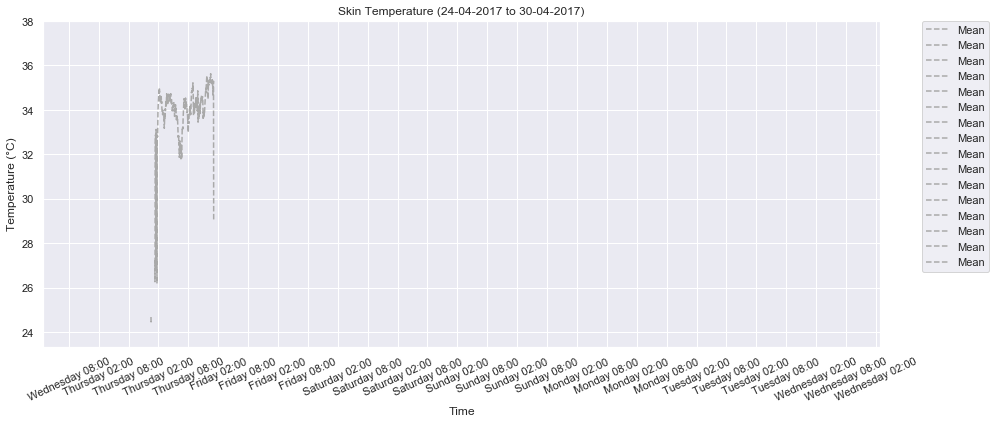

In [60]:
# fig, ax = plt.subplots()
from datetime import date, timedelta
import seaborn as sns
import matplotlib.dates as mdates

# Use seaborn style defaults and set the default figure size
sns.set(rc={'figure.figsize':(15, 6)})
hours = mdates.HourLocator(interval = 6)
start=oneminuteaverage.index.min()
end=oneminuteaverage.index.max()
print(start)
print(end)
# print(oneminuteaverage.loc['2017-04-18', 'TEMP'])
plt.xticks( rotation=25 )
ax=plt.gca()
# ax.set_xlim(["00:00:00", "23:59:59"])
# Set x-axis major ticks to weekly interval, on Mondays
# ax.xaxis.set_major_locator(mdates.WeekdayLocator(byweekday=mdates.MONDAY))
# Format x-tick labels as 3-letter month name and day number
# ax.xaxis.set_major_formatter(mdates.DateFormatter('%b %d'));
h_fmt = mdates.DateFormatter('%A %I:%M')
# plt.gcf().axes[0].xaxis.set_major_formatter(h_fmt)
# oneminuteaverage.sort_index()
# df.PRe[startDate:stopDate].plot(ax=axes[k])
# ax=df_temp.loc['2017-04-24':'2017-04-30', 'TEMP'].plot(marker='o',linestyle='-',label='Temperature')
delta = timedelta(days=7)
# fig.autofmt_xdate()
while start<=end:
    plt.plot(oneminuteaverage.loc[start:start+delta, 'TEMP'], label='Mean', linestyle='--',c='darkgrey')
#     ax = oneminuteaverage.loc[start:start+delta, 'TEMP'].plot( linestyle='-',label='average per minute')
#     ax = fifteenminuteaverage.loc['2017-04-24':'2017-04-30', 'TEMP'].plot(marker='o',linestyle='--',label='average per 15 minute')
    print(start+delta)
    ax.set_xlim([start, start+delta])

    ax.xaxis.set_major_locator(hours)
    ax.xaxis.set_major_formatter(h_fmt)
    ax.set_ylabel('Temperature (°C)')
    ax.set_xlabel('Time')
    ax.set_title('Skin Temperature (24-04-2017 to 30-04-2017)')
    start=start+delta
# fig.autofmt_xdate()
    plt.legend(bbox_to_anchor=(1.05, 1), loc=2, borderaxespad=0.)
#         plt.legend(bbox_to_anchor=(0, 1), loc='upper left', ncol=1)
# fig.tight_layout()

# fig, ax = plt.subplots(figsize=(25,15))#figsize=(15,15)
# markers=['o', '.', ',', 'x', '+', 'v', '^', '<', '>', 's', 'd']
i=0
count=0

# for date in oneminuteaverage.index:
#     df = df_temp[df_temp.dates == date]
# #     plt.plot(df['NewTime'],df['TEMP'],markers[i],label=date+"='{0}'".format(markers[i]))
#     plt.plot(df['NewTime'],df['TEMP'],'o',label=date)
#     i=i+1   
#     count=count+1
#     if i % 1==0:
#         i = 0
#         print(df)
#         plt.plot(df['NewTime'],df['mean_total'], label='Mean', linestyle='--',c='darkgrey')
# #         datenums=md.date2num(date)
#         plt.xticks( rotation=25 )
#         ax=plt.gca()
#         ax.set_xlim(["00:00:00", "23:59:59"])
#         plt.title("Skin Temperature (Day="+str(date)+")",fontsize=20)
# #         hours = mdates.HourLocator(interval = 1)
# #         h_fmt = mdates.DateFormatter('%H:%M:%S')
# #         ax.xaxis.set_major_locator(hours)
# #         ax.xaxis.set_major_formatter(h_fmt)
#         ax.set_ylabel('Temperature (°C)')
#         ax.set_xlabel('Time')
#         fig.autofmt_xdate()
#         plt.legend(bbox_to_anchor=(1.05, 1), loc=2, borderaxespad=0.)
# #         plt.legend(bbox_to_anchor=(0, 1), loc='upper left', ncol=1)
#         fig.tight_layout()
# #         plt.savefig("daily_temperature/Date="+str(date)+""+".png",bbox_inches="tight")
#         plt.show() 
#         if(count==5):
#             break

In [61]:


#df_temp['TEMP'].head()
# df_temp.head(5)
# oneminuteaverage.head(5)
fifteenminuteaverage.head(5)

,TEMP
mydatentime,
2017-04-05 10:45:00-04:00,33.203140
2017-04-05 11:00:00-04:00,33.263722
2017-04-05 11:15:00-04:00,32.467867
2017-04-05 11:30:00-04:00,31.975133
2017-04-05 11:45:00-04:00,31.374756


In [62]:
#make date time columns seperately
import datetime as dt
import pytz
import pandas as pd

date_time_str = '2018-06-29 17:08:00'
date_time_obj = dt.datetime.strptime(date_time_str, '%Y-%m-%d %H:%M:%S')

# dateList = []
# TimeList=[]
# dateandtimeList=[]
# averagetemplist=[]
# finaldate = dt.datetime.today()
# i=0
# for date,time in zip(df_temp.date, df_temp.time): 
#     dateList.append(dt.datetime.strptime(date +" "+time, '%y-%m-%d %H:%M:%S').date())
#     TimeList.append(dt.datetime.strptime(date +" "+time, '%y-%m-%d %H:%M:%S').time())
#     dateandtimeList.append(dt.datetime.strptime(date +" "+time, '%y-%m-%d %H:%M:%S'))
#     i=i+1
count=0
# for date in df_temp.date: 
#     count=count+1
#     df = df_temp[df_temp.date == date]
#     averagetemplist.append(df['TEMP'].mean())
    
# df_temp['mean_total']=df_temp['TEMP'].mean()
# df_temp['averagedaytemp']=averagetemplist
# df_temp['datess']=dateList
# df_temp['NewTime']=TimeList
# df_temp['DatenTime']=dateandtimeList

    
# df12=df_temp[['DatenTime','TEMP']]

# Convert the data to daily frequency, without filling any missings
# df12['DatenTime'] = df12['DatenTime'].asfreq('H')
# # Create a column with missings forward filled
# df12['forward filll'] = df12.asfreq('H', method='ffill')
# df12.head()

print(df_temp)


                                   TEMP
mydatentime                            
2017-04-12 20:34:40-04:00         33.87
2017-04-12 20:34:40.250000-04:00  33.87
2017-04-12 20:34:40.500000-04:00  33.87
2017-04-12 20:34:40.750000-04:00  33.87
2017-04-12 20:34:41-04:00         33.89
2017-04-12 20:34:41.250000-04:00  33.89
2017-04-12 20:34:41.500000-04:00  33.89
2017-04-12 20:34:41.750000-04:00  33.89
2017-04-12 20:34:42-04:00         33.87
2017-04-12 20:34:42.250000-04:00  33.87
2017-04-12 20:34:42.500000-04:00  33.87
2017-04-12 20:34:42.750000-04:00  33.87
2017-04-12 20:34:43-04:00         33.89
2017-04-12 20:34:43.250000-04:00  33.89
2017-04-12 20:34:43.500000-04:00  33.89
2017-04-12 20:34:43.750000-04:00  33.89
2017-04-12 20:34:44-04:00         33.93
2017-04-12 20:34:44.250000-04:00  33.93
2017-04-12 20:34:44.500000-04:00  33.93
2017-04-12 20:34:44.750000-04:00  33.93
2017-04-12 20:34:45-04:00         33.77
2017-04-12 20:34:45.250000-04:00  33.77
2017-04-12 20:34:45.500000-04:00  33.77


In [ ]:
#daily with matplotlib sorting dates in correct order
import matplotlib.pyplot as plt
from datetime import time
import seaborn as sns
import numpy as np


df_temp.describe()
print(df_temp)
# sns.set(style="darkgrid")
# df_sub = df_temp[['DatenTime','datess','NewTime','TEMP','mean_total','averagedaytemp']]

# df['tick_datetime'] = pd.to_datetime(df['tick_datetime'])
# df = df.set_index('tick_datetime')

# df_sub.set_index('DatenTime', inplace=True)
# hourly_avg = df_sub.groupby(pd.TimeGrouper('H')).mean()
# hourly_avg.head()

# Date = hourly_avg.groupby(pd.TimeGrouper('D'))
# Date.head()



# plt.plot(hourly_avg['TEMP'],'o')

# print(hourly_avg)
# df_sub.sort_values(by='datess')
# df_sub.head()
# all_dates = set(df_sub['datess'])#Getting all dates
# all_detes=sorted(all_dates)
# all_date_list = list(sorted(all_dates))

# pd.plotting.register_matplotlib_converters()
# df_temp.plot(x = "DatenTime", y = "TEMP",ax = ax, use_index =True, label = date,marker = 'o', rot=90)
i = 0
# fig, ax = plt.subplots(figsize=(25,15))#figsize=(15,15)
# markers=['o', '.', ',', 'x', '+', 'v', '^', '<', '>', 's', 'd']
# i=0
# count=0

# for date in Date.index:
#     df = df_sub[df_sub.datess == date]
# #     plt.plot(df['NewTime'],df['TEMP'],markers[i],label=date+"='{0}'".format(markers[i]))
#     plt.plot(df['NewTime'],df['TEMP'],'o',label=date)
#     i=i+1   
#     count=count+1
#     if i % 1==0:
#         i = 0
#         print(df)
#         plt.plot(df['NewTime'],df['mean_total'], label='Mean', linestyle='--',c='darkgrey')
# #         datenums=md.date2num(date)
#         plt.xticks( rotation=25 )
#         ax=plt.gca()
#         ax.set_xlim(["00:00:00", "23:59:59"])
#         plt.title("Skin Temperature (Day="+str(date)+")",fontsize=20)
# #         hours = mdates.HourLocator(interval = 1)
# #         h_fmt = mdates.DateFormatter('%H:%M:%S')
# #         ax.xaxis.set_major_locator(hours)
# #         ax.xaxis.set_major_formatter(h_fmt)
#         ax.set_ylabel('Temperature (°C)')
#         ax.set_xlabel('Time')
#         fig.autofmt_xdate()
#         plt.legend(bbox_to_anchor=(1.05, 1), loc=2, borderaxespad=0.)
# #         plt.legend(bbox_to_anchor=(0, 1), loc='upper left', ncol=1)
#         fig.tight_layout()
# #         plt.savefig("daily_temperature/Date="+str(date)+""+".png",bbox_inches="tight")
#         plt.show() 
#         if(count==5):
#             break
           #remove this to generate plots for all dates


In [63]:
# df_sub = df_temp[['datess','NewTime','TEMP','mean_total','averagedaytemp']]
# ticks = ['12:00 AM', '1:00 AM', '2:00 AM', '3:00 AM', '4:00 AM', '5:00 AM', '6:00 AM', '7:00 AM','8:00 AM','9:00 AM','10:00 AM','11:00 AM','12:00 PM', '1:00 PM', '2:00 PM', '3:00 PM', '4:00 PM',  '5:00 PM', '6:00 PM', '7:00 PM', '8:00 PM', '9:00 PM', '10:00 PM', '11:00 PM' ]
# tickstime=[]
# format = '%H:%M %p'
# for tic in ticks:
#     tickstime.append(datetime.strptime(tic, format).time())
# print(tickstime)
oneminuteaverage['fifteenminavg']=df_temp.resample('15T').mean()
df_sub=oneminuteaverage
# df_sub.sort_values(by='datess')
# df_sub.head()
# all_dates = set(df_sub['datess'])#Getting all dates
# all_detes=sorted(all_dates)
# all_date_list = list(sorted(all_dates))
#convert unique dates to a list for loop
# df_temp.set_index('mydatentime', inplace=True)
df_temp.drop('time_stamp', axis=1, inplace=True)
# df_sub['date']=df_sub.index.map(lambda t: t.date())
# df_sub['NewTime']=df_sub.index.map(lambda t: t.time())
# df_sub.head(20)
# dates=df_sub.index.map(lambda t: t.date()).unique()
# print(dates)
# df_sub.head(30)

KeyError: "['time_stamp'] not found in axis"

2017-04-05
2017-04-06
2017-04-07
2017-04-08
2017-04-09
2017-04-10
2017-04-11
2017-04-12
2017-04-13
2017-04-14
2017-04-15
2017-04-16
2017-04-17
2017-04-18
2017-04-19
2017-04-20
2017-04-21
2017-04-22
2017-04-23
2017-04-24
2017-04-25
2017-04-26
2017-04-27
2017-04-28
2017-04-29
2017-04-30
2017-05-01
2017-05-02
2017-05-03
2017-05-04
2017-05-05
2017-05-06
2017-05-07
2017-05-08
2017-05-09
2017-05-10
2017-05-11
2017-05-12
2017-05-13
2017-05-14
2017-05-15
2017-05-16
2017-05-17
2017-05-18
2017-05-19
2017-05-20
2017-05-21
2017-05-22
2017-05-23
2017-05-24
2017-05-25
2017-05-26
2017-05-27
2017-05-28
2017-05-29
2017-05-30
2017-05-31
2017-06-01
2017-06-02
2017-06-03
2017-06-04
2017-06-05
2017-06-06
2017-06-07
2017-06-08
2017-06-09
2017-06-10
2017-06-11
2017-06-12
2017-06-13
2017-06-14
2017-06-15
2017-06-16
2017-06-17
2017-06-18
2017-06-19
2017-06-20
2017-06-21
2017-06-22
2017-06-23
2017-06-24
2017-06-25
2017-06-26
2017-06-27
2017-06-28
2017-06-29
2017-06-30
2017-07-01
2017-07-02
2017-07-03
2017-07-04

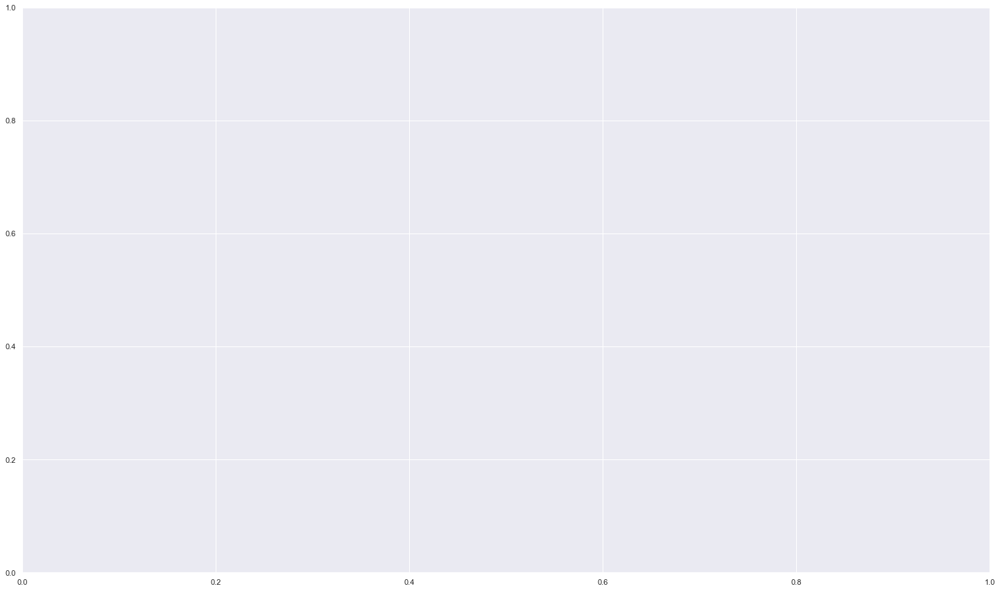

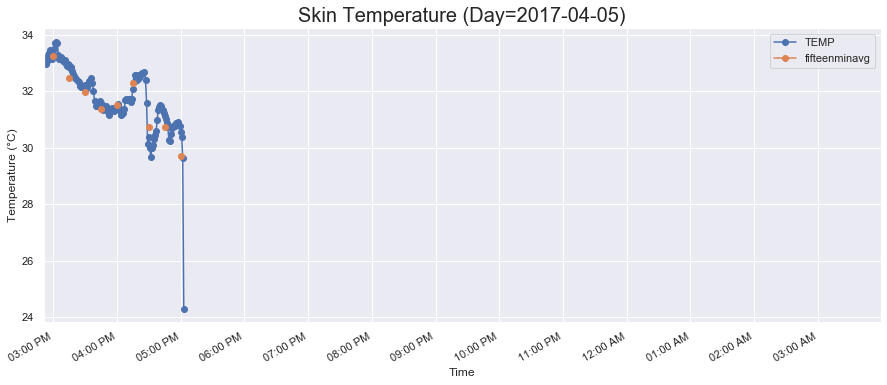

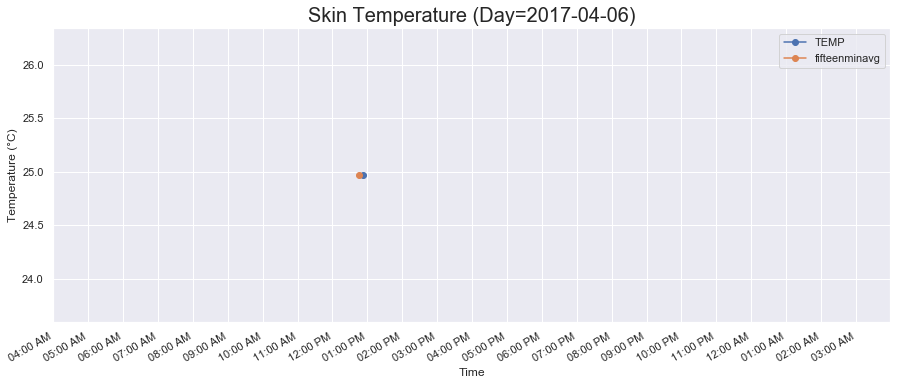

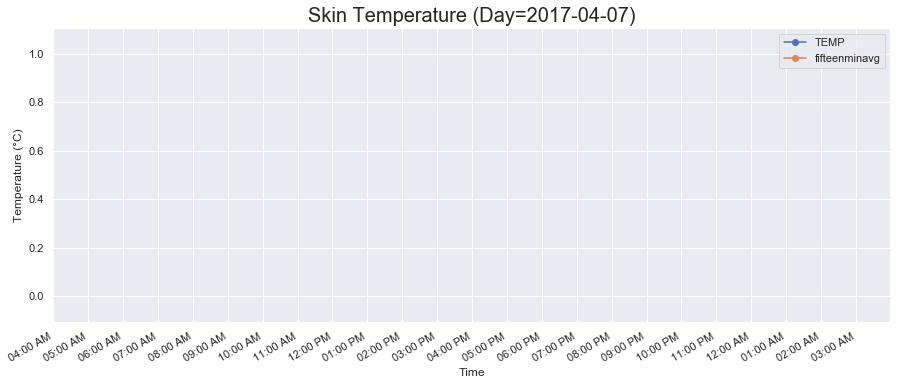

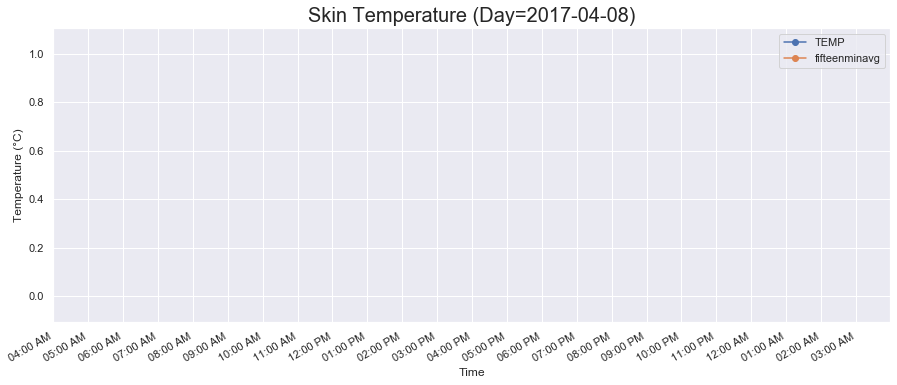

...

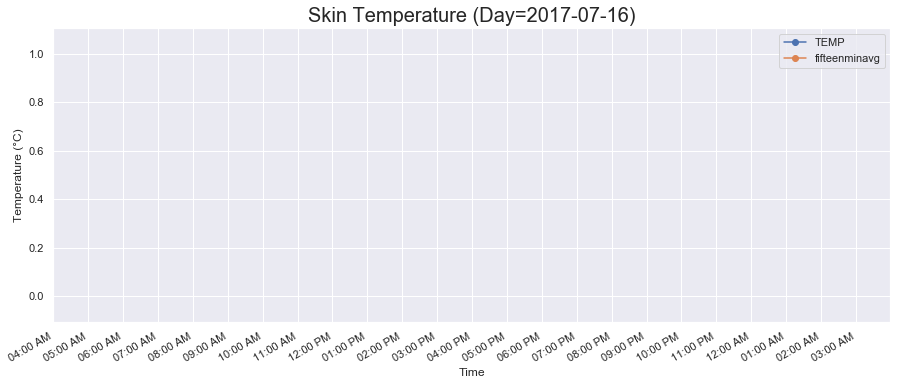

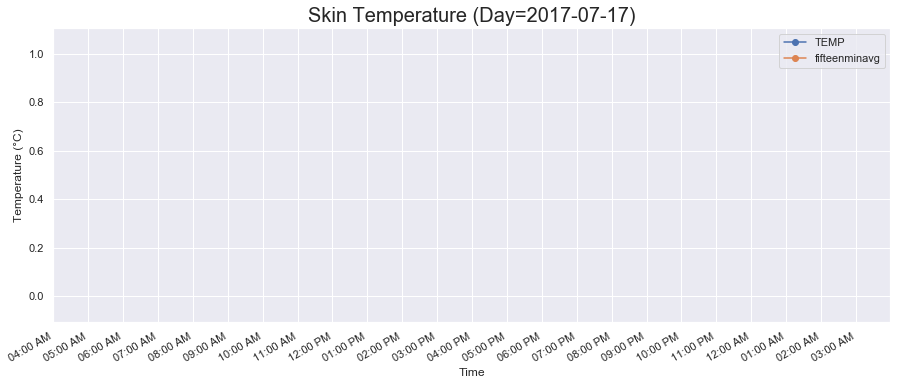

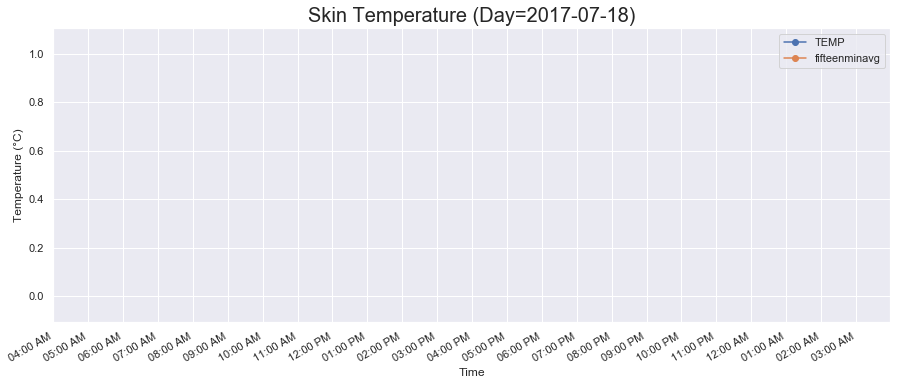

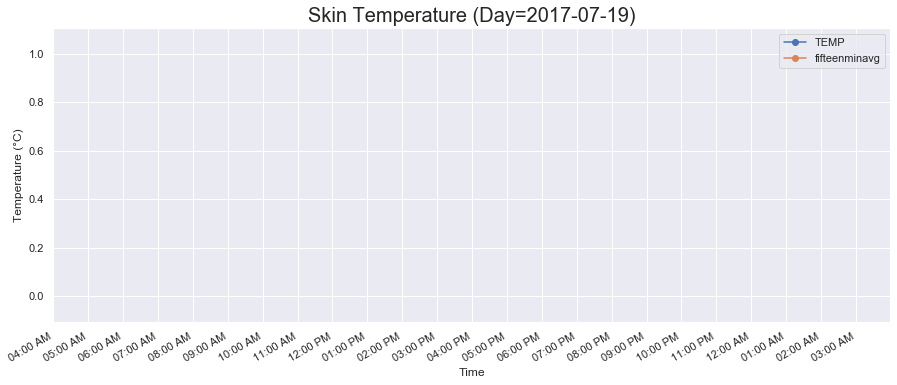

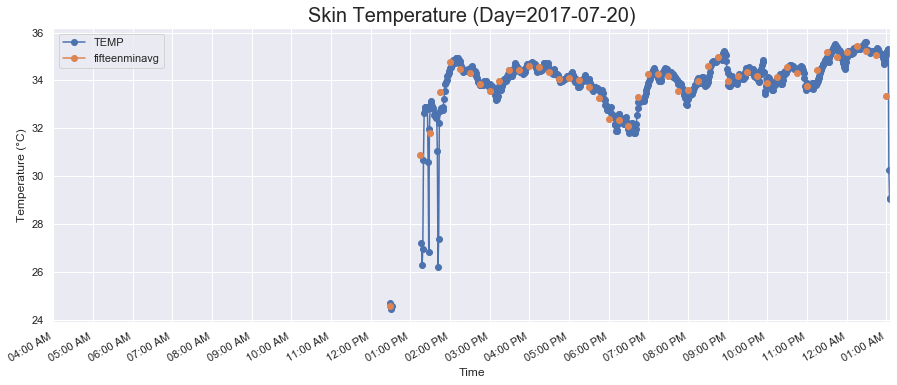

In [72]:
fig, ax = plt.subplots(figsize=(25,15))#figsize=(15,15)
for date in strdate:
    print(date)
    ax=df_sub.loc[date].plot(marker='o')
#     plt.xlim(xmin=datetime.datetime(2017, 1, 4, hour=0),xmax=datetime.datetime(2017, 1, 4, hour=24))
#     ax.set_xlim(["00:00", "23:59"])
    hours = mdates.HourLocator(interval = 1)
    h_fmt = mdates.DateFormatter('%I:%M %p')
    ax.xaxis.set_major_locator(hours)
    ax.xaxis.set_major_formatter(h_fmt)
    ax=plt.gca()
#     ax.set_xticklabels(tickstime)
    plt.title("Skin Temperature (Day="+str(date)+")",fontsize=20)
    ax.set_ylabel('Temperature (°C)')
    ax.set_xlabel('Time')
#     plt.savefig("Migraine_Plots/Temperature/daily_temperature/Date="+str(date)+""+".png",bbox_inches="tight")


In [ ]:
print(dates)
strdate=[]
for date in dates:
    strdate.append(date.strftime('%Y-%m-%d'))
print(strdate)

In [ ]:
#Weekly with matplotlib sorting dates in correct order
import matplotlib.pyplot as plt
from datetime import time
import matplotlib.dates as mdates
import seaborn as sns
import numpy as np
sns.set(style="darkgrid")

# pd.plotting.register_matplotlib_converters()
# # df_temp.plot(x = "DatenTime", y = "TEMP",ax = ax, use_index =True, label = date,marker = 'o', rot=90)
i = 0
fig, ax = plt.subplots(figsize=(18,8))#figsize=(15,15)
markers=['o', '.', ',', 'x', '+', 'v', '^', '<', '>', 's', 'd']
i=0
df_temp.head(5)
for date in dates:
    df = df_sub[df_sub.date == date]
#     plt.plot(df['NewTime'],df['TEMP'],markers[i],label=date+"='{0}'".format(markers[i]))
    plt.plot(df['NewTime'],df['TEMP'],markers[i],label=date)
    
#     plt.plot(df.index,df['TEMP'],'o',label=date)

    i=i+1   
    if i % 1==0:
        i = 0
        print(date)
        plt.plot(df['NewTime'],df['fifteenminavg'], label='Mean', linestyle='--',c='darkgrey')
#         plt.xticks( rotation=25 )
#         ax=plt.gca()
        ax.set_xlim(["00:00:00", "23:59:59"])
        plt.title("Skin Temperature (Week="+str(date)+")",fontsize=20)
#         ax.set_xticks(np.linspace(0, 2*np.pi, 24, endpoint=True))
        # set the label names
        
#         ticks = ['12 AM', '1 AM', '2 AM', '3 AM', '4 AM', '5 AM', '6 AM', '7 AM','8 AM','9 AM','10 AM','11 AM','12 PM', '1 PM', '2 PM', '3 PM', '4 PM',  '5 PM', '6 PM', '7 PM', '8 PM', '9 PM', '10 PM', '11 PM' ]
#         ax.set_xticklabels(tickstime)
#         ax=plt.gca()
        
#         hours = mdates.HourLocator(interval = 1)
#         h_fmt = mdates.DateFormatter('%H:%M:%S')
#         ax.xaxis.set_major_locator(hours)
#         ax.xaxis.set_major_formatter(h_fmt)
        
        ax.set_ylabel('Temperature (°C)')
        ax.set_xlabel('Time')
        fig.autofmt_xdate()
        plt.legend(bbox_to_anchor=(1.05, 1), loc=2, borderaxespad=0.)
#         plt.grid(linestyle='--', alpha=0.5)
       
#         plt.legend(bbox_to_anchor=(0, 1), loc='upper left', ncol=1)
#         plt.legend()
        fig.tight_layout()
#         fig.savefig('test.pdf')
#         plt.savefig("Migraine_Plots/Temperature/daily_temperature/Date="+str(date)+""+".png",bbox_inches="tight")
        plt.show()  
        fig, ax = plt.subplots(figsize=(18,8))#figsize=(15,15)

In [ ]:
#Weekly with matplotlib sorting dates in correct order
import matplotlib.pyplot as plt
from datetime import time
import matplotlib.dates as mdates
import seaborn as sns
import numpy as np
sns.set(style="darkgrid")
i = 0
fig, ax = plt.subplots(figsize=(18,8))#figsize=(15,15)
markers=['o', '.', ',', 'x', '+', 'v', '^', '<', '>', 's', 'd']
i=0   # variable using for counter if i==7 (weekly)
#made a list of unique dates for loop  
for date in dates:
    # selecting dataframe for specific date
    df = df_sub[df_sub.date == date]
    plt.plot(df['NewTime'],df['TEMP'],markers[i],label=date)   
    i=i+1   
    if i % 1==0:
        i = 0
        print(date)
        plt.plot(df['NewTime'],df['fifteenminavg'], label='Mean', linestyle='--',c='darkgrey')
#         plt.xticks( rotation=25 )
#         ax=plt.gca()
        ax.set_xlim(["00:00:00", "23:59:59"])
        plt.title("Skin Temperature (Week="+str(date)+")",fontsize=20)
#         ax.set_xticks(np.linspace(0, 2*np.pi, 24, endpoint=True))
#         ticks = ['12 AM', '1 AM', '2 AM', '3 AM', '4 AM', '5 AM', '6 AM', '7 AM','8 AM','9 AM','10 AM','11 AM','12 PM', '1 PM', '2 PM', '3 PM', '4 PM',  '5 PM', '6 PM', '7 PM', '8 PM', '9 PM', '10 PM', '11 PM' ]
#         ax.set_xticklabels(tickstime)
#         ax=plt.gca()
#         hours = mdates.HourLocator(interval = 1)
#         h_fmt = mdates.DateFormatter('%H:%M:%S')
#         ax.xaxis.set_major_locator(hours)
#         ax.xaxis.set_major_formatter(h_fmt) 
        ax.set_ylabel('Temperature (°C)')
        ax.set_xlabel('Time')
        fig.autofmt_xdate()
        plt.legend(bbox_to_anchor=(1.05, 1), loc=2, borderaxespad=0.)
        fig.tight_layout()
        plt.show()  
        fig, ax = plt.subplots(figsize=(18,8))#figsize=(15,15)

In [ ]:
#Weekly with matplotlib sorting dates in correct order
import matplotlib.pyplot as plt
from datetime import time
import matplotlib.dates as mdates
import seaborn as sns
import numpy as np
sns.set(style="darkgrid")

# pd.plotting.register_matplotlib_converters()
# # df_temp.plot(x = "DatenTime", y = "TEMP",ax = ax, use_index =True, label = date,marker = 'o', rot=90)
i = 0
fig, ax = plt.subplots(figsize=(18,8))#figsize=(15,15)
markers=['o', '.', ',', 'x', '+', 'v', '^', '<', '>', 's', 'd']
i=0
df_temp.head(5)
for date in dates:
    df = df_sub[df_sub.date == date]
#     plt.plot(df['NewTime'],df['TEMP'],markers[i],label=date+"='{0}'".format(markers[i]))
    plt.plot(df['NewTime'],df['fifteenminavg'],markers[i],label=date)
    
#     plt.plot(df.index,df['TEMP'],'o',label=date)

    i=i+1   
    if i % 7==0:
        i = 0
        print(date)
#         plt.plot(df['NewTime'],df['mean_total'], label='Mean', linestyle='--',c='darkgrey')
#         plt.xticks( rotation=25 )
#         ax=plt.gca()
        ax.set_xlim(["00:00:00", "23:59:59"])
        plt.title("Skin Temperature (Week="+str(date)+")",fontsize=20)
#         ax.set_xticks(np.linspace(0, 2*np.pi, 24, endpoint=True))
        # set the label names
        
#         ticks = ['12 AM', '1 AM', '2 AM', '3 AM', '4 AM', '5 AM', '6 AM', '7 AM','8 AM','9 AM','10 AM','11 AM','12 PM', '1 PM', '2 PM', '3 PM', '4 PM',  '5 PM', '6 PM', '7 PM', '8 PM', '9 PM', '10 PM', '11 PM' ]
#         ax.set_xticklabels(tickstime)
#         ax=plt.gca()
        
#         hours = mdates.HourLocator(interval = 1)
#         h_fmt = mdates.DateFormatter('%H:%M:%S')
#         ax.xaxis.set_major_locator(hours)
#         ax.xaxis.set_major_formatter(h_fmt)
        ax.set_ylabel('Temperature (°C)')
        ax.set_xlabel('Time')
        fig.autofmt_xdate()
        plt.legend(bbox_to_anchor=(1.05, 1), loc=2, borderaxespad=0.)
#         plt.grid(linestyle='--', alpha=0.5)
       
#         plt.legend(bbox_to_anchor=(0, 1), loc='upper left', ncol=1)
#         plt.legend()
        fig.tight_layout()
#         fig.savefig('test.pdf')
        plt.savefig("Migraine_Plots/Temperature/weekly_temperature/Date="+str(date)+""+".png",bbox_inches="tight")
        plt.show()  
        fig, ax = plt.subplots(figsize=(18,8))#figsize=(15,15)

In [ ]:
#monthly with matplotlib sorting dates in correct order
import matplotlib.pyplot as plt
from datetime import time
import matplotlib.dates as mdates
import seaborn as sns
import numpy as np
sns.set(style="darkgrid")

# pd.plotting.register_matplotlib_converters()
# # df_temp.plot(x = "DatenTime", y = "TEMP",ax = ax, use_index =True, label = date,marker = 'o', rot=90)
i = 0
fig, ax = plt.subplots(figsize=(18,8))#figsize=(15,15)
markers=['o', '.', ',', 'x', '+', 'v', '^', '<', '>', 's', 'd']
i=0
df_temp.head(5)
for date in dates:
    df = df_sub[df_sub.date == date]
#     plt.plot(df['NewTime'],df['TEMP'],markers[i],label=date+"='{0}'".format(markers[i]))
    plt.plot(df['NewTime'],df['fifteenminavg'],'o')
    
#     plt.plot(df.index,df['TEMP'],'o',label=date)

    i=i+1   
    if i % 30==0:
        i = 0
        print(date)
#         plt.plot(df['NewTime'],df['mean_total'], label='Mean', linestyle='--',c='darkgrey')
#         plt.xticks( rotation=25 )
#         ax=plt.gca()
        ax.set_xlim(["00:00:00", "23:59:59"])
        plt.title("Skin Temperature (Month="+str(date.strftime("%B"))+")",fontsize=20)
#         plt.title("Skin Temperature (Week="+str(date)+")",fontsize=20)
#         ax.set_xticks(np.linspace(0, 2*np.pi, 24, endpoint=True))
        # set the label names
        
#         ticks = ['12 AM', '1 AM', '2 AM', '3 AM', '4 AM', '5 AM', '6 AM', '7 AM','8 AM','9 AM','10 AM','11 AM','12 PM', '1 PM', '2 PM', '3 PM', '4 PM',  '5 PM', '6 PM', '7 PM', '8 PM', '9 PM', '10 PM', '11 PM' ]
#         ax.set_xticklabels(tickstime)
#         ax=plt.gca()
        
#         hours = mdates.HourLocator(interval = 1)
#         h_fmt = mdates.DateFormatter('%H:%M:%S')
#         ax.xaxis.set_major_locator(hours)
#         ax.xaxis.set_major_formatter(h_fmt)
        ax.set_ylabel('Temperature (°C)')
        ax.set_xlabel('Time')
        fig.autofmt_xdate()
        plt.legend(bbox_to_anchor=(1.05, 1), loc=2, borderaxespad=0.)
#         plt.grid(linestyle='--', alpha=0.5)
       
#         plt.legend(bbox_to_anchor=(0, 1), loc='upper left', ncol=1)
#         plt.legend()
        fig.tight_layout()
#         fig.savefig('test.pdf')
        plt.savefig("Migraine_Plots/Temperature/monthly_temperature/Date="+str(date)+""+".png",bbox_inches="tight")
        plt.show()  
        fig, ax = plt.subplots(figsize=(18,8))#figsize=(15,15)

In [ ]:
#Monthly with matplotlib sorting dates in correct order
import matplotlib.pyplot as plt
from datetime import time
import matplotlib.dates as mdates
import seaborn as sns
import numpy as np
# sns.set(style="darkgrid")
# df_sub = df_temp[['datess','NewTime','TEMP','mean_total','averagedaytemp']]

df_sub.sort_values(by='datess')
df_sub.head()
all_dates = set(df_sub['datess'])#Getting all dates
all_detes=sorted(all_dates) #sorting them
all_date_list = list(sorted(all_dates)) # putting in a list

pd.plotting.register_matplotlib_converters()
# df_temp.plot(x = "DatenTime", y = "TEMP",ax = ax, use_index =True, label = date,marker = 'o', rot=90)
i = 0
# fig, ax = plt.subplots(figsize=(25,15))#figsize=(15,15)
markers=['o', '.', ',', 'x', '+', 'v', '^', '<', '>', 's', 'd']
i=0
df_temp.head(5)
for date in all_date_list:
    df = df_sub[df_sub.datess == date]
#     plt.plot(df['NewTime'],df['TEMP'],markers[i],label=date+"='{0}'".format(markers[i]))
    plt.plot(df['NewTime'],df['TEMP'],'o')
    i=i+1   
    if i % 30==0:
        i = 0
        print(date)
        plt.plot(df['NewTime'],df['mean_total'], label='Mean', linestyle='--',c='darkgrey')
#         datenums=md.date2num(date)
        plt.xticks( rotation=25 )
#         ax=plt.gca()
        #Set the circumference ticks
        
#         xfmt = md.DateFormatter('%Y-%m-%d %H:%M:%S')
#         ax.xaxis.set_major_formatter(xfmt)
#         ax.set_xlim(["00:00:00", "23:59:59"])
        plt.title("Skin Temperature (Month="+str(date.strftime("%B"))+")",fontsize=20)
        
#         hours = mdates.HourLocator(interval = 1)
#         h_fmt = mdates.DateFormatter('%H:%M:%S')
#         ax.xaxis.set_major_locator(hours)
#         ax.xaxis.set_major_formatter(h_fmt)
        ax.set_ylabel('Temperature (°C)')
        ax.set_xlabel('Time')
        fig.autofmt_xdate()
        plt.legend(bbox_to_anchor=(1.05, 1), loc=2, borderaxespad=0.)
#         plt.grid(linestyle='--', alpha=0.5)
       
#         plt.legend(bbox_to_anchor=(0, 1), loc='upper left', ncol=1)
#         plt.legend()
#         fig.tight_layout()
#         fig.savefig('test.pdf')
#         plt.savefig("monthly_temperature/Date="+str(date)+""+".png",bbox_inches="tight")
        plt.show()  


# EDA(Electrodermal Activity)

In [6]:
#Reading Electrodermal Activity Data
df_eda = get_all_data(dict_vars['EDA'])
df_eda.reset_index(inplace=True,drop=True)

File name:  sensor_data\A010e9_170413-003439 / EDA.csv , Initial Time:  1492043679.0 , Frequency:  4.0 , No of Rows:  325832
File name:  sensor_data\A010e9_170417-154337 / EDA.csv , Initial Time:  1492443817.0 , Frequency:  4.0 , No of Rows:  1958
File name:  sensor_data\A010e9_170420-130630 / EDA.csv , Initial Time:  1492693590.0 , Frequency:  4.0 , No of Rows:  1346
File name:  sensor_data\A010e9_170421-001318 / EDA.csv , Initial Time:  1492733598.0 , Frequency:  4.0 , No of Rows:  162272
File name:  sensor_data\A010e9_170421-133357 / EDA.csv , Initial Time:  1492781637.0 , Frequency:  4.0 , No of Rows:  320738
File name:  sensor_data\A010e9_170422-121529 / EDA.csv , Initial Time:  1492863329.0 , Frequency:  4.0 , No of Rows:  75056
File name:  sensor_data\A010e9_170422-172924 / EDA.csv , Initial Time:  1492882164.0 , Frequency:  4.0 , No of Rows:  132638
File name:  sensor_data\A010e9_170423-024315 / EDA.csv , Initial Time:  1492915395.0 , Frequency:  4.0 , No of Rows:  180842
File 

File name:  sensor_data\A012ce_170420-114354 / EDA.csv , Initial Time:  1492688634.0 , Frequency:  4.0 , No of Rows:  236966
File name:  sensor_data\A012ce_170421-041235 / EDA.csv , Initial Time:  1492747955.0 , Frequency:  4.0 , No of Rows:  330332
File name:  sensor_data\A012ce_170422-122454 / EDA.csv , Initial Time:  1492863894.0 , Frequency:  4.0 , No of Rows:  520112
File name:  sensor_data\A012ce_170424-010522 / EDA.csv , Initial Time:  1492995922.0 , Frequency:  4.0 , No of Rows:  475370
File name:  sensor_data\A012ce_170425-104408 / EDA.csv , Initial Time:  1493117048.0 , Frequency:  4.0 , No of Rows:  386084
File name:  sensor_data\A012ce_170427-031805 / EDA.csv , Initial Time:  1493263085.0 , Frequency:  4.0 , No of Rows:  734240
File name:  sensor_data\A012ce_170429-152714 / EDA.csv , Initial Time:  1493479634.0 , Frequency:  4.0 , No of Rows:  141728
File name:  sensor_data\A012ce_170430-143057 / EDA.csv , Initial Time:  1493562657.0 , Frequency:  4.0 , No of Rows:  139688


In [7]:

print(df_eda.head(10))
df_eda.describe()



     time_stamp       EDA
0  1.492044e+09  0.000000
1  1.492044e+09  0.540559
2  1.492044e+09  0.713487
3  1.492044e+09  1.080104
4  1.492044e+09  0.626718
5  1.492044e+09  0.679237
6  1.492044e+09  0.680518
7  1.492044e+09  0.658742
8  1.492044e+09  0.695889
9  1.492044e+09  0.709980


,time_stamp,EDA
count,3.273439e+07,3.273439e+07
mean,1.495503e+09,4.757900e-01
std,2.349490e+06,1.182335e+00
min,1.491404e+09,0.000000e+00
25%,1.493329e+09,2.049100e-02
50%,1.495350e+09,1.613510e-01
75%,1.497788e+09,5.147540e-01
max,1.500599e+09,6.002896e+01


RangeIndex(start=0, stop=32734392, step=1)


NameError: name 'butter_lowpass_filter' is not defined

In [21]:
# Deleting outliers


print("Keeping Values between: ",dict_vars['EDA']['min']," and ",dict_vars['EDA']['max'])
df_eda = df_eda[(df_eda.EDA >= dict_vars['EDA']['min']) &
                                (df_eda.EDA <= dict_vars['EDA']['max'])] #Only keeping values lower than 200

Keeping Values between:  0.0  and  20.0


In [9]:
#Displaying Bar Graph of Count
# display_frequency_bar_chart(df_eda['EDA'],"Electrodermal Activity Micro siemens (μS)","Count")
# print("Data Size after removing outliers" + str(df_eda.shape))
df_eda.sort_values('time_stamp',inplace=True)#Sorting by index time_stamp
df_eda['mydatentime'] = df_eda['time_stamp'].map(r)
df_eda.set_index('mydatentime', inplace=True)
# df_eda1=df_eda.resample('T').mean()
# oneminuteaverage=df_temp.resample('T').mean()
# print(len(oneminuteaverage.index))
# df_eda1['Mean']=df_eda1['EDA'].resample('15T').mean()

df_eda.drop('time_stamp', axis=1, inplace=True)
df_eda['date']=df_eda.index.map(lambda t: t.date())
df_eda['NewTime']=df_eda.index.map(lambda t: t.time())
df_eda.head(20)

,EDA,date,NewTime
mydatentime,,,
2017-04-05 10:51:39-04:00,0.000000,2017-04-05,10:51:39
2017-04-05 10:51:39.250000-04:00,0.843838,2017-04-05,10:51:39.250000
2017-04-05 10:51:39.500000-04:00,1.191116,2017-04-05,10:51:39.500000
2017-04-05 10:51:39.750000-04:00,1.629110,2017-04-05,10:51:39.750000
2017-04-05 10:51:40-04:00,2.106829,2017-04-05,10:51:40
2017-04-05 10:51:40.250000-04:00,2.594893,2017-04-05,10:51:40.250000
2017-04-05 10:51:40.500000-04:00,3.117440,2017-04-05,10:51:40.500000
2017-04-05 10:51:40.750000-04:00,3.613620,2017-04-05,10:51:40.750000
2017-04-05 10:51:41-04:00,4.109793,2017-04-05,10:51:41


In [10]:

dates=df_eda.index.map(lambda t: t.date()).unique()
df_eda.head(30)
strdate=[]
for date in dates:
    strdate.append(date.strftime('%Y-%m-%d'))
print(strdate)

['2017-04-05', '2017-04-06', '2017-04-07', '2017-04-12', '2017-04-13', '2017-04-14', '2017-04-16', '2017-04-17', '2017-04-18', '2017-04-19', '2017-04-20', '2017-04-21', '2017-04-22', '2017-04-23', '2017-04-24', '2017-04-25', '2017-04-26', '2017-04-27', '2017-04-28', '2017-04-29', '2017-04-30', '2017-05-01', '2017-05-02', '2017-05-03', '2017-05-04', '2017-05-05', '2017-05-06', '2017-05-07', '2017-05-08', '2017-05-09', '2017-05-10', '2017-05-11', '2017-05-12', '2017-05-13', '2017-05-14', '2017-05-15', '2017-05-16', '2017-05-17', '2017-05-18', '2017-05-19', '2017-05-20', '2017-05-21', '2017-05-22', '2017-05-23', '2017-05-24', '2017-05-25', '2017-05-26', '2017-05-29', '2017-05-30', '2017-05-31', '2017-06-01', '2017-06-02', '2017-06-03', '2017-06-04', '2017-06-05', '2017-06-06', '2017-06-07', '2017-06-08', '2017-06-09', '2017-06-10', '2017-06-11', '2017-06-12', '2017-06-13', '2017-06-14', '2017-06-15', '2017-06-16', '2017-06-17', '2017-06-18', '2017-06-19', '2017-06-20', '2017-06-21', '2017

In [11]:
# resampling to 8hz
def interpolateEmptyValues(data):
    cols = data.columns.values
    for c in cols:
        data.loc[:, c] = data[c].interpolate()

    return data

def interpolateDataTo8Hz(data,sample_rate,startTime):
    if sample_rate<8:
        # Upsample by linear interpolation
        if sample_rate==2:
            data.index = pd.date_range(start=startTime, periods=len(data), freq='500L')
        elif sample_rate==4:
            data.index = pd.date_range(start=startTime, periods=len(data), freq='250L')
        data = data.resample("125L").mean()
    else:
        if sample_rate>8:
            # Downsample
            idx_range = list(range(0,len(data))) # TODO: double check this one
            data = data.iloc[idx_range[0::int(int(sample_rate)/8)]]
        # Set the index to be 8Hz
        data.index = pd.date_range(start=startTime, periods=len(data), freq='125L')

    # Interpolate all empty values
    data = interpolateEmptyValues(data)
    return data

startTime=df_eda.index[0]

interpolateDataTo8Hz(df_eda,4,startTime)

,EDA
2017-04-05 10:51:39-04:00,0.000000
2017-04-05 10:51:39.125000-04:00,0.421919
2017-04-05 10:51:39.250000-04:00,0.843838
2017-04-05 10:51:39.375000-04:00,1.017477
2017-04-05 10:51:39.500000-04:00,1.191116
2017-04-05 10:51:39.625000-04:00,1.410113
2017-04-05 10:51:39.750000-04:00,1.629110
2017-04-05 10:51:39.875000-04:00,1.867970
2017-04-05 10:51:40-04:00,2.106829
2017-04-05 10:51:40.125000-04:00,2.350861


In [12]:
import scipy.signal as scisig
def butter_lowpass(cutoff, fs, order=5):
    # Filtering Helper functions
    nyq = 0.5 * fs
    normal_cutoff = cutoff / nyq
    b, a = scisig.butter(order, normal_cutoff, btype='low', analog=False)
    return b, a
#low pass filter
def butter_lowpass_filter(data, cutoff, fs, order=5):
    # Filtering Helper functions
    b, a = butter_lowpass(cutoff, fs, order=order)
    y = scisig.lfilter(b, a, data)
    return y

df_eda['filtered_eda'] =  butter_lowpass_filter(df_eda['EDA'], 1.0, 8, 6)



In [13]:
# df_eda.head()

#Displaying Bar Graph of Count
# display_frequency_bar_chart(df_eda['EDA'],"Electrodermal Activity Micro siemens (μS)","Count")
# print("Data Size after removing outliers" + str(df_eda.shape))
# df_eda.sort_values('time_stamp',inplace=True)#Sorting by index time_stamp
# df_eda['mydatentime'] = df_eda['time_stamp'].map(r)
# df_eda.set_index('mydatentime', inplace=True)
# df_eda['mean']=df_eda.resample('T').mean()
# oneminuteaverage=df_temp.resample('T').mean()
# print(len(oneminuteaverage.index))
# df_eda1['Mean']=df_eda1['EDA'].resample('15T').mean()

# df_eda.drop('time_stamp', axis=1, inplace=True)
df_eda['date']=df_eda.index.map(lambda t: t.date())
df_eda['NewTime']=df_eda.index.map(lambda t: t.time())
df_eda.head(20)

,EDA,date,NewTime,filtered_eda
2017-04-05 10:51:39-04:00,0.000000,2017-04-05,10:51:39,0.000000
2017-04-05 10:51:39.250000-04:00,0.843838,2017-04-05,10:51:39.250000,0.000887
2017-04-05 10:51:39.500000-04:00,1.191116,2017-04-05,10:51:39.500000,0.009220
2017-04-05 10:51:39.750000-04:00,1.629110,2017-04-05,10:51:39.750000,0.046333
2017-04-05 10:51:40-04:00,2.106829,2017-04-05,10:51:40,0.151794
2017-04-05 10:51:40.250000-04:00,2.594893,2017-04-05,10:51:40.250000,0.369281
2017-04-05 10:51:40.500000-04:00,3.117440,2017-04-05,10:51:40.500000,0.720739
2017-04-05 10:51:40.750000-04:00,3.613620,2017-04-05,10:51:40.750000,1.190268
2017-04-05 10:51:41-04:00,4.109793,2017-04-05,10:51:41,1.731034
2017-04-05 10:51:41.250000-04:00,4.207560,2017-04-05,10:51:41.250000,2.288261


In [14]:
# df_eda1.head(30)
df_sub1=df_eda
df_sub1.describe()

,EDA,filtered_eda
count,3.273439e+07,3.273439e+07
mean,4.757900e-01,4.757900e-01
std,1.182335e+00,1.088760e+00
min,0.000000e+00,-3.459074e-01
25%,2.049100e-02,5.758281e-02
50%,1.613510e-01,2.148666e-01
75%,5.147540e-01,5.030924e-01
max,6.002896e+01,5.308738e+01


C:\Users\Chisel-Lab\Anaconda3\lib\site-packages\IPython\core\events.py:88: UserWarning: Creating legend with loc="best" can be slow with large amounts of data.
  func(*args, **kwargs)
C:\Users\Chisel-Lab\Anaconda3\lib\site-packages\IPython\core\pylabtools.py:128: UserWarning: Creating legend with loc="best" can be slow with large amounts of data.
  fig.canvas.print_figure(bytes_io, **kw)


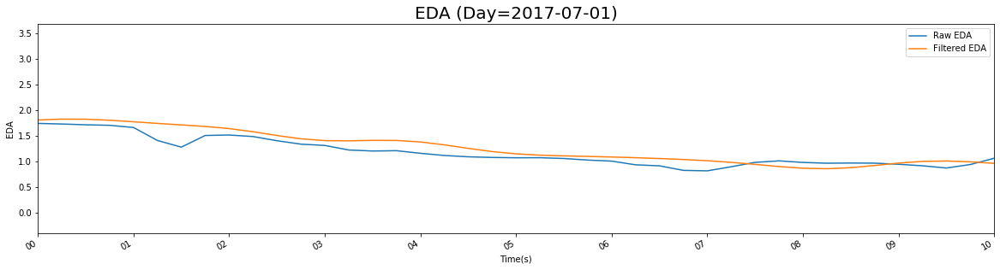

In [101]:
#eda daily
import seaborn as sns
plt.figure(1,figsize=(20, 5))
# a=df_eda.loc['2017-05-19']
ax=a['EDA'].plot(label='Raw EDA')
ax=a['filtered_eda'].plot(label='Filtered EDA')

# hours = mdates.HourLocator(interval = 2)
h_fmt = mdates.DateFormatter('%S')
# ax.xaxis.set_major_locator(hours)
ax.xaxis.set_major_formatter(h_fmt)
# ax.set_xlim([date+" 00:00", date+" 23:59"])
ax.set_xlim(["2017-05-19 21:49:00","2017-05-19 21:49:10"])
# ax=plt.gca()
# plt.gcf().autofmt_xdate()
#     ax.set_xticklabels(tickstime)
plt.title("EDA (Day="+str(date)+")",fontsize=20)
ax.set_ylabel('EDA')
ax.set_xlabel('Time(s)')
plt.legend()
# ax.set_xticks(xlabels)
# ax.set_xticklabels(rotation=20)
# ax.set_xlim()
# plt.savefig("Migraine_Plots/EDA/daily_eda/Date="+str(date)+""+".png",bbox_inches="tight")


In [78]:
import cvxEDA
y=x['EDA'].values
# yn = (y - y.mean()) / y.std()
Fs = 8.
[x['phasic'], p, x['tonic'], l, d, e, obj] = cvxEDA.cvxEDA(y, 1./Fs)
import pylab as pl
tm = pl.arange(1., len(y)+1.) / Fs
# pl.hold(True)
pl.plot(tm, y)
pl.plot(tm, p)
pl.plot(tm, r)

pl.plot(tm, x['tonic'])
pl.show()

IndexError: only integers, slices (`:`), ellipsis (`...`), numpy.newaxis (`None`) and integer or boolean arrays are valid indices

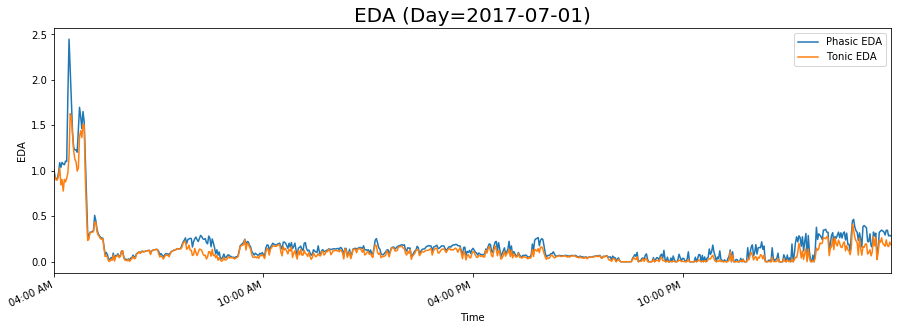

In [118]:
#eda daily with phasic and tonic component
import matplotlib.pyplot as plt
from datetime import time
import seaborn as sns
import matplotlib.dates as mdates
import seaborn as sns
# plt.figure(1,figsize=(20, 5))
Fs = 8.
count=0



# fig, ax = plt.subplots(figsize=(20,5))#figsize=(15,15)
# count=count+1
# df=df_eda.loc[date]
# y=df['filtered_eda'].values
# [df['phasic'], p, df['tonic'], l, d, e, obj] = cvxEDA.cvxEDA(y, 1./Fs)
# #     df_final = df[df['tonic'] > 0]
# df[df['tonic'] < 0] = 0
# #         df = df[df['tonic'] < 0==0]
# df_final = df.resample('2T').mean()
#     print(df_final)
#     print(df_final)
x=df_final.index
ax=df_final['filtered_eda'].plot(label='Phasic EDA')
ax=df_final['tonic'].plot(label='Tonic EDA')

#     ax=df_final['filtered_eda'].plot()
#     ax=df_final['tonic'].plot()
# ax.set_xlim(["2017-07-01 04:00:00","2017-07-01 04:59:59"])
# ax.set_xlim(["00:00:00", "23:59:59"])
hours = mdates.HourLocator(interval = 6)
h_fmt = mdates.DateFormatter('%I:%M %p')
ax.xaxis.set_major_locator(hours)
ax.xaxis.set_major_formatter(h_fmt)
# ax=plt.gca()
#     ax.set_xticklabels(tickstime)
plt.title("EDA (Day="+str(date)+")",fontsize=20)
plt.legend()
plt.xticks( rotation=25 )
ax.set_ylabel('EDA')
ax.set_xlabel('Time')
plt.savefig("Migraine_Plots/EDA/daily_eda/Date=="+str(date)+""+".png",bbox_inches="tight")
#     plt.figure(1,figsize=(20, 5))
#     if(count==10):
#         break

     pcost       dcost       gap    pres   dres
 0: -4.7823e+04 -4.7410e+04  5e+05  8e+02  2e-02
 1: -4.7579e+04 -9.5074e+04  5e+04  8e+01  2e-03
 2: -4.7622e+04 -6.2070e+04  1e+04  2e+01  4e-04
 3: -4.7664e+04 -5.6363e+04  9e+03  9e+00  2e-04
 4: -4.7697e+04 -5.3836e+04  6e+03  5e+00  1e-04
 5: -4.7706e+04 -5.1384e+04  4e+03  2e+00  5e-05
 6: -4.7756e+04 -4.9484e+04  2e+03  7e-01  2e-05
 7: -4.7988e+04 -4.8501e+04  5e+02  7e-02  1e-06
 8: -4.8191e+04 -4.8433e+04  2e+02  3e-02  6e-07
 9: -4.8299e+04 -4.8406e+04  1e+02  8e-03  2e-07
10: -4.8347e+04 -4.8396e+04  5e+01  3e-03  6e-08
11: -4.8370e+04 -4.8391e+04  2e+01  1e-03  2e-08
12: -4.8380e+04 -4.8389e+04  9e+00  2e-04  3e-09
13: -4.8384e+04 -4.8388e+04  4e+00  6e-05  1e-09
14: -4.8386e+04 -4.8388e+04  2e+00  2e-05  3e-10
15: -4.8387e+04 -4.8387e+04  6e-01  4e-06  9e-11
16: -4.8387e+04 -4.8387e+04  4e-01  1e-06  3e-11
17: -4.8387e+04 -4.8387e+04  1e-01  4e-07  9e-12
18: -4.8387e+04 -4.8387e+04  4e-02  6e-08  1e-12
19: -4.8387e+04 -4.83

C:\Users\Chisel-Lab\Anaconda3\lib\site-packages\ipykernel_launcher.py:19: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
C:\Users\Chisel-Lab\Anaconda3\lib\site-packages\ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
C:\Users\Chisel-Lab\Anaconda3\lib\site-packages\pandas\core\indexing.py:543: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/in

     pcost       dcost       gap    pres   dres
 0: -3.8181e+04 -3.7841e+04  5e+05  7e+02  1e-02
 1: -3.7898e+04 -7.8500e+04  4e+04  7e+01  1e-03
 2: -3.7857e+04 -4.6779e+04  9e+03  1e+01  2e-04
 3: -3.7855e+04 -4.2276e+04  4e+03  5e+00  9e-05
 4: -3.7830e+04 -4.1536e+04  4e+03  3e+00  6e-05
 5: -3.7877e+04 -3.9480e+04  2e+03  1e+00  2e-05
 6: -3.7927e+04 -3.8636e+04  7e+02  4e-01  7e-06
 7: -3.8164e+04 -3.8309e+04  1e+02  2e-02  5e-07
 8: -3.8221e+04 -3.8295e+04  7e+01  1e-02  2e-07
 9: -3.8256e+04 -3.8287e+04  3e+01  3e-03  5e-08
10: -3.8269e+04 -3.8284e+04  2e+01  8e-04  2e-08
11: -3.8277e+04 -3.8283e+04  6e+00  3e-04  5e-09
12: -3.8280e+04 -3.8282e+04  3e+00  8e-05  1e-09
13: -3.8281e+04 -3.8282e+04  9e-01  2e-05  4e-10
14: -3.8282e+04 -3.8282e+04  4e-01  4e-06  7e-11
15: -3.8282e+04 -3.8282e+04  1e-01  3e-07  5e-12
16: -3.8282e+04 -3.8282e+04  4e-02  4e-08  7e-13
17: -3.8282e+04 -3.8282e+04  1e-02  5e-09  9e-14
18: -3.8282e+04 -3.8282e+04  3e-03  6e-10  1e-14
19: -3.8282e+04 -3.82

29: -7.6686e+05 -7.6686e+05  5e-03  7e-10  2e-14
30: -7.6686e+05 -7.6686e+05  3e-03  2e-10  4e-14
31: -7.6686e+05 -7.6686e+05  8e-04  1e-10  3e-14
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -6.5563e+05 -6.5425e+05  2e+06  1e+03  1e-02
 1: -6.5574e+05 -9.3508e+05  4e+05  3e+02  2e-03
 2: -6.5626e+05 -8.4713e+05  2e+05  1e+02  1e-03
 3: -6.5674e+05 -8.2212e+05  2e+05  9e+01  8e-04
 4: -6.5747e+05 -7.7940e+05  1e+05  6e+01  5e-04
 5: -6.5768e+05 -7.7794e+05  1e+05  5e+01  4e-04
 6: -6.5862e+05 -7.5022e+05  9e+04  3e+01  3e-04
 7: -6.5883e+05 -7.4892e+05  9e+04  3e+01  3e-04
 8: -6.6011e+05 -7.1864e+05  6e+04  2e+01  2e-04
 9: -6.6126e+05 -7.0056e+05  4e+04  1e+01  8e-05
10: -6.6193e+05 -6.8450e+05  2e+04  4e+00  3e-05
11: -6.6206e+05 -6.7145e+05  9e+03  1e+00  1e-05
12: -6.6276e+05 -6.6538e+05  3e+03  2e-01  1e-06
13: -6.6353e+05 -6.6478e+05  1e+03  6e-02  5e-07
14: -6.6393e+05 -6.6458e+05  6e+02  2e-02  2e-07
15: -6.6396e+05 -6.6456e+05  6e+02  2e-02  2e-

     pcost       dcost       gap    pres   dres
 0: -3.9640e+05 -3.9404e+05  6e+06  2e+03  6e-02
 1: -3.9608e+05 -1.3381e+06  1e+06  4e+02  1e-02
 2: -3.9607e+05 -7.9201e+05  4e+05  1e+02  3e-03
 3: -3.9574e+05 -5.6454e+05  2e+05  4e+01  1e-03
 4: -3.9538e+05 -4.6673e+05  7e+04  1e+01  3e-04
 5: -3.9493e+05 -4.3376e+05  4e+04  6e+00  1e-04
 6: -3.9476e+05 -4.1323e+05  2e+04  2e+00  6e-05
 7: -3.9480e+05 -4.0198e+05  7e+03  7e-01  2e-05
 8: -3.9611e+05 -3.9804e+05  2e+03  1e-01  3e-06
 9: -3.9668e+05 -3.9776e+05  1e+03  4e-02  1e-06
10: -3.9715e+05 -3.9768e+05  5e+02  1e-02  3e-07
11: -3.9741e+05 -3.9766e+05  3e+02  5e-03  1e-07
12: -3.9755e+05 -3.9766e+05  1e+02  2e-03  4e-08
13: -3.9760e+05 -3.9765e+05  5e+01  4e-04  1e-08
14: -3.9763e+05 -3.9765e+05  3e+01  2e-04  4e-09
15: -3.9764e+05 -3.9765e+05  1e+01  5e-05  1e-09
16: -3.9765e+05 -3.9765e+05  5e+00  2e-05  4e-10
17: -3.9765e+05 -3.9765e+05  2e+00  6e-06  1e-10
18: -3.9765e+05 -3.9765e+05  8e-01  2e-06  4e-11
19: -3.9765e+05 -3.97

20: -8.8143e+05 -8.8144e+05  6e-01  9e-07  1e-11
21: -8.8144e+05 -8.8144e+05  3e-01  2e-07  2e-12
22: -8.8144e+05 -8.8144e+05  8e-02  4e-08  6e-13
23: -8.8144e+05 -8.8144e+05  3e-02  8e-09  1e-13
24: -8.8144e+05 -8.8144e+05  9e-03  1e-09  2e-14
25: -8.8144e+05 -8.8144e+05  4e-03  3e-10  3e-14
26: -8.8144e+05 -8.8144e+05  1e-03  7e-11  1e-14
27: -8.8144e+05 -8.8144e+05  6e-04  3e-11  2e-14
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -7.1080e+03 -6.7686e+03  5e+05  7e+02  4e-02
 1: -6.8240e+03 -4.3943e+04  4e+04  6e+01  4e-03
 2: -6.7823e+03 -1.5016e+04  8e+03  1e+01  7e-04
 3: -6.7359e+03 -1.0311e+04  4e+03  4e+00  2e-04
 4: -6.6798e+03 -8.5999e+03  2e+03  1e+00  9e-05
 5: -6.7705e+03 -7.3561e+03  6e+02  2e-01  2e-05
 6: -6.9854e+03 -7.1741e+03  2e+02  6e-02  4e-06
 7: -7.0601e+03 -7.1562e+03  1e+02  2e-02  2e-06
 8: -7.1004e+03 -7.1510e+03  5e+01  1e-02  6e-07
 9: -7.1226e+03 -7.1490e+03  3e+01  4e-03  3e-07
10: -7.1355e+03 -7.1479e+03  1e+01  1e-03  6e-

C:\Users\Chisel-Lab\Anaconda3\lib\site-packages\ipykernel_launcher.py:15: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  from ipykernel import kernelapp as app


     pcost       dcost       gap    pres   dres
 0: -2.9197e+05 -2.9146e+05  6e+05  8e+02  1e-02
 1: -2.9176e+05 -3.7282e+05  1e+05  1e+02  2e-03
 2: -2.9180e+05 -3.2812e+05  4e+04  4e+01  5e-04
 3: -2.9179e+05 -3.1793e+05  3e+04  2e+01  3e-04
 4: -2.9170e+05 -3.1254e+05  2e+04  1e+01  2e-04
 5: -2.9171e+05 -2.9835e+05  7e+03  4e+00  6e-05
 6: -2.9165e+05 -2.9656e+05  5e+03  3e+00  4e-05
 7: -2.9175e+05 -2.9326e+05  2e+03  6e-01  8e-06
 8: -2.9211e+05 -2.9243e+05  3e+02  6e-03  8e-08
 9: -2.9223e+05 -2.9242e+05  2e+02  3e-03  4e-08
10: -2.9231e+05 -2.9241e+05  1e+02  1e-03  2e-08
11: -2.9236e+05 -2.9241e+05  5e+01  5e-04  6e-09
12: -2.9238e+05 -2.9241e+05  3e+01  2e-04  2e-09
13: -2.9240e+05 -2.9241e+05  1e+01  3e-05  4e-10
14: -2.9240e+05 -2.9241e+05  5e+00  1e-05  1e-10
15: -2.9240e+05 -2.9241e+05  2e+00  3e-06  4e-11
16: -2.9240e+05 -2.9241e+05  9e-01  9e-07  1e-11
17: -2.9240e+05 -2.9241e+05  4e-01  2e-07  3e-12
18: -2.9241e+05 -2.9241e+05  1e-01  6e-08  8e-13
19: -2.9241e+05 -2.92

 4: -2.1173e+05 -3.2912e+05  1e+05  2e+01  4e-04
 5: -2.1141e+05 -2.5175e+05  4e+04  6e+00  1e-04
 6: -2.1143e+05 -2.1918e+05  8e+03  7e-01  1e-05
 7: -2.1261e+05 -2.1619e+05  4e+03  3e-01  6e-06
 8: -2.1344e+05 -2.1525e+05  2e+03  1e-01  3e-06
 9: -2.1402e+05 -2.1494e+05  9e+02  4e-02  8e-07
10: -2.1441e+05 -2.1488e+05  5e+02  2e-02  3e-07
11: -2.1462e+05 -2.1486e+05  2e+02  6e-03  1e-07
12: -2.1474e+05 -2.1485e+05  1e+02  2e-03  4e-08
13: -2.1479e+05 -2.1485e+05  6e+01  9e-04  2e-08
14: -2.1482e+05 -2.1484e+05  3e+01  3e-04  6e-09
15: -2.1483e+05 -2.1484e+05  1e+01  9e-05  2e-09
16: -2.1484e+05 -2.1484e+05  6e+00  3e-05  5e-10
17: -2.1484e+05 -2.1484e+05  3e+00  1e-05  2e-10
18: -2.1484e+05 -2.1484e+05  1e+00  2e-06  5e-11
19: -2.1484e+05 -2.1484e+05  4e-01  5e-07  1e-11
20: -2.1484e+05 -2.1484e+05  2e-01  1e-07  3e-12
21: -2.1484e+05 -2.1484e+05  8e-02  4e-08  8e-13
22: -2.1484e+05 -2.1484e+05  2e-02  6e-09  1e-13
23: -2.1484e+05 -2.1484e+05  7e-03  6e-10  2e-14
24: -2.1484e+05 -2.1

     pcost       dcost       gap    pres   dres
 0: -1.3352e+05 -1.3298e+05  7e+05  8e+02  2e-02
 1: -1.3326e+05 -2.3634e+05  1e+05  1e+02  2e-03
 2: -1.3324e+05 -1.8704e+05  6e+04  5e+01  1e-03
 3: -1.3314e+05 -1.6532e+05  3e+04  2e+01  4e-04
 4: -1.3308e+05 -1.4488e+05  1e+04  7e+00  1e-04
 5: -1.3305e+05 -1.3831e+05  5e+03  3e+00  5e-05
 6: -1.3301e+05 -1.3499e+05  2e+03  7e-01  1e-05
 7: -1.3337e+05 -1.3380e+05  4e+02  3e-02  5e-07
 8: -1.3354e+05 -1.3378e+05  2e+02  1e-02  2e-07
 9: -1.3363e+05 -1.3377e+05  1e+02  6e-03  1e-07
10: -1.3370e+05 -1.3376e+05  7e+01  2e-03  4e-08
11: -1.3373e+05 -1.3376e+05  3e+01  6e-04  1e-08
12: -1.3374e+05 -1.3376e+05  1e+01  2e-04  4e-09
13: -1.3375e+05 -1.3376e+05  8e+00  8e-05  1e-09
14: -1.3375e+05 -1.3376e+05  3e+00  2e-05  4e-10
15: -1.3376e+05 -1.3376e+05  1e+00  6e-06  1e-10
16: -1.3376e+05 -1.3376e+05  5e-01  2e-06  3e-11
17: -1.3376e+05 -1.3376e+05  2e-01  5e-07  9e-12
18: -1.3376e+05 -1.3376e+05  6e-02  1e-07  2e-12
19: -1.3376e+05 -1.33

 1: -5.1877e+04 -1.6572e+05  1e+05  2e+02  4e-03
 2: -5.1841e+04 -1.0608e+05  6e+04  5e+01  2e-03
 3: -5.1824e+04 -7.8300e+04  3e+04  2e+01  6e-04
 4: -5.1877e+04 -6.4501e+04  1e+04  7e+00  2e-04
 5: -5.1933e+04 -6.0928e+04  9e+03  4e+00  1e-04
 6: -5.1967e+04 -5.7497e+04  6e+03  2e+00  6e-05
 7: -5.1987e+04 -5.4466e+04  2e+03  6e-01  2e-05
 8: -5.2421e+04 -5.2981e+04  6e+02  3e-02  8e-07
 9: -5.2639e+04 -5.2942e+04  3e+02  1e-02  4e-07
10: -5.2770e+04 -5.2926e+04  2e+02  4e-03  1e-07
11: -5.2843e+04 -5.2919e+04  8e+01  1e-03  4e-08
12: -5.2878e+04 -5.2916e+04  4e+01  6e-04  2e-08
13: -5.2895e+04 -5.2915e+04  2e+01  2e-04  7e-09
14: -5.2904e+04 -5.2914e+04  9e+00  9e-05  2e-09
15: -5.2909e+04 -5.2913e+04  4e+00  2e-05  7e-10
16: -5.2911e+04 -5.2913e+04  2e+00  8e-06  2e-10
17: -5.2912e+04 -5.2913e+04  7e-01  2e-06  6e-11
18: -5.2912e+04 -5.2913e+04  2e-01  6e-07  2e-11
19: -5.2912e+04 -5.2913e+04  1e-01  2e-07  4e-12
20: -5.2913e+04 -5.2913e+04  3e-02  3e-08  8e-13
21: -5.2913e+04 -5.2

12: -7.1064e+05 -7.1079e+05  1e+02  3e-03  2e-08
13: -7.1071e+05 -7.1078e+05  8e+01  1e-03  7e-09
14: -7.1074e+05 -7.1078e+05  4e+01  4e-04  3e-09
15: -7.1076e+05 -7.1077e+05  2e+01  1e-04  7e-10
16: -7.1077e+05 -7.1077e+05  8e+00  3e-05  2e-10
17: -7.1077e+05 -7.1077e+05  4e+00  1e-05  9e-11
18: -7.1077e+05 -7.1077e+05  2e+00  3e-06  3e-11
19: -7.1077e+05 -7.1077e+05  6e-01  5e-08  4e-13
20: -7.1077e+05 -7.1077e+05  2e-01  1e-08  1e-13
21: -7.1077e+05 -7.1077e+05  7e-02  3e-09  2e-14
22: -7.1077e+05 -7.1077e+05  2e-02  5e-10  2e-14
23: -7.1077e+05 -7.1077e+05  1e-02  2e-10  2e-14
24: -7.1077e+05 -7.1077e+05  4e-03  4e-11  2e-14
25: -7.1077e+05 -7.1077e+05  1e-03  1e-11  6e-15
26: -7.1077e+05 -7.1077e+05  4e-04  1e-11  3e-14
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -3.1188e+05 -3.1103e+05  1e+06  1e+03  8e-03
 1: -3.1180e+05 -4.6640e+05  2e+05  2e+02  2e-03
 2: -3.1195e+05 -4.1076e+05  1e+05  1e+02  7e-04
 3: -3.1197e+05 -3.9739e+05  9e+04  7e+01  5e-

15: -1.2512e+06 -1.2512e+06  2e+01  3e-05  2e-10
16: -1.2512e+06 -1.2512e+06  1e+01  9e-06  7e-11
17: -1.2512e+06 -1.2512e+06  5e+00  3e-06  2e-11
18: -1.2512e+06 -1.2512e+06  2e+00  6e-07  4e-12
19: -1.2512e+06 -1.2512e+06  9e-01  1e-07  1e-12
20: -1.2512e+06 -1.2512e+06  3e-01  1e-08  8e-14
21: -1.2512e+06 -1.2512e+06  1e-01  2e-09  4e-14
22: -1.2512e+06 -1.2512e+06  4e-02  2e-10  4e-14
23: -1.2512e+06 -1.2512e+06  1e-02  5e-11  1e-14
24: -1.2512e+06 -1.2512e+06  5e-03  3e-11  2e-14
25: -1.2512e+06 -1.2512e+06  1e-03  3e-11  3e-14
26: -1.2512e+06 -1.2512e+06  5e-04  3e-11  4e-14
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -6.3214e+04 -6.2865e+04  5e+05  7e+02  1e-02
 1: -6.2948e+04 -1.0147e+05  4e+04  6e+01  9e-04
 2: -6.2939e+04 -7.2934e+04  1e+04  1e+01  2e-04
 3: -6.2951e+04 -6.6951e+04  4e+03  4e+00  6e-05
 4: -6.2966e+04 -6.5193e+04  2e+03  2e+00  3e-05
 5: -6.2993e+04 -6.4081e+04  1e+03  6e-01  8e-06
 6: -6.3198e+04 -6.3460e+04  3e+02  8e-03  1e-

17: -2.5995e+06 -2.5995e+06  2e+00  6e-06  3e-11
18: -2.5995e+06 -2.5995e+06  6e-01  1e-06  6e-12
19: -2.5995e+06 -2.5995e+06  2e-01  3e-07  1e-12
20: -2.5995e+06 -2.5995e+06  7e-02  5e-08  3e-13
21: -2.5995e+06 -2.5995e+06  2e-02  7e-09  4e-14
22: -2.5995e+06 -2.5995e+06  8e-03  8e-10  1e-14
23: -2.5995e+06 -2.5995e+06  3e-03  1e-10  2e-14
24: -2.5995e+06 -2.5995e+06  8e-04  5e-11  4e-14
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -3.7951e+04 -3.7182e+04  1e+06  1e+03  3e-02
 1: -3.7743e+04 -1.8965e+05  2e+05  2e+02  5e-03
 2: -3.7725e+04 -1.0440e+05  7e+04  5e+01  2e-03
 3: -3.7688e+04 -8.2235e+04  5e+04  3e+01  8e-04
 4: -3.7627e+04 -7.5683e+04  4e+04  2e+01  6e-04
 5: -3.7636e+04 -6.0186e+04  2e+04  1e+01  3e-04
 6: -3.7545e+04 -5.3926e+04  2e+04  6e+00  2e-04
 7: -3.7382e+04 -4.6276e+04  9e+03  2e+00  7e-05
 8: -3.7467e+04 -4.0517e+04  3e+03  5e-01  2e-05
 9: -3.7838e+04 -3.8912e+04  1e+03  6e-02  2e-06
10: -3.8276e+04 -3.8774e+04  5e+02  3e-02  8e-

20: -1.0905e+04 -1.0905e+04  6e-05  2e-11  3e-14
21: -1.0905e+04 -1.0905e+04  1e-05  3e-12  5e-15
22: -1.0905e+04 -1.0905e+04  3e-06  2e-12  2e-14
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0: -1.7851e+05 -1.7762e+05  2e+06  1e+03  2e-02
 1: -1.7830e+05 -5.1076e+05  4e+05  4e+02  4e-03
 2: -1.7828e+05 -3.2180e+05  2e+05  1e+02  1e-03
 3: -1.7814e+05 -2.5585e+05  8e+04  4e+01  4e-04
 4: -1.7801e+05 -2.0631e+05  3e+04  1e+01  1e-04
 5: -1.7777e+05 -1.9093e+05  1e+04  4e+00  5e-05
 6: -1.7761e+05 -1.8371e+05  6e+03  1e+00  2e-05
 7: -1.7803e+05 -1.7962e+05  2e+03  9e-02  1e-06
 8: -1.7865e+05 -1.7945e+05  8e+02  4e-02  5e-07
 9: -1.7899e+05 -1.7939e+05  4e+02  1e-02  1e-07
10: -1.7918e+05 -1.7937e+05  2e+02  5e-03  6e-08
11: -1.7927e+05 -1.7937e+05  1e+02  2e-03  2e-08
12: -1.7932e+05 -1.7936e+05  5e+01  5e-04  6e-09
13: -1.7934e+05 -1.7936e+05  2e+01  2e-04  2e-09
14: -1.7935e+05 -1.7936e+05  1e+01  7e-05  8e-10
15: -1.7935e+05 -1.7936e+05  5e+00  2e-05  2e-

KeyboardInterrupt: 

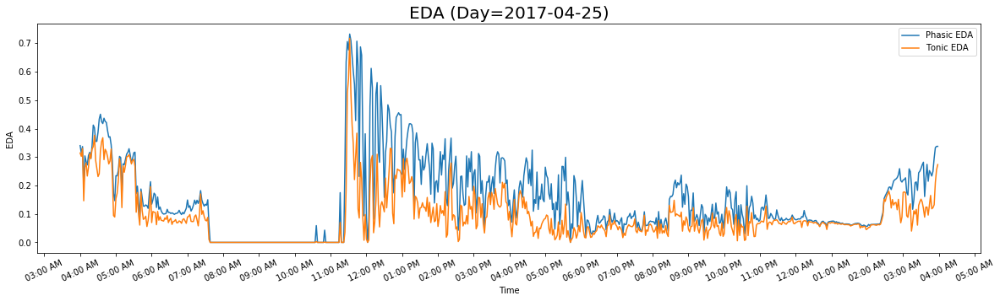

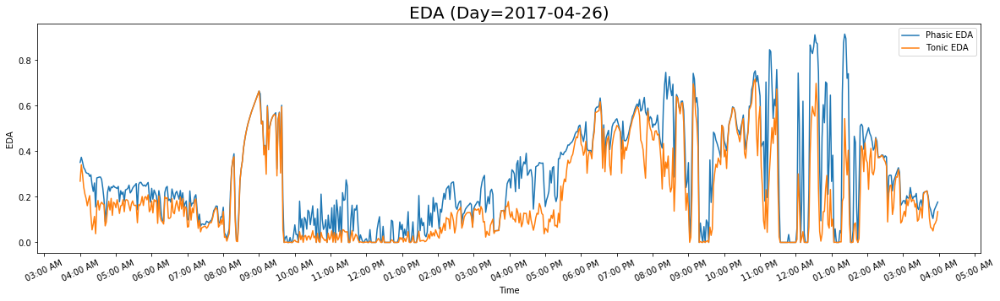

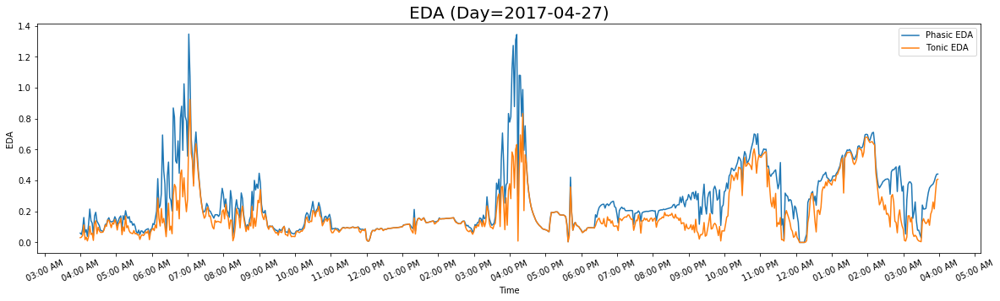

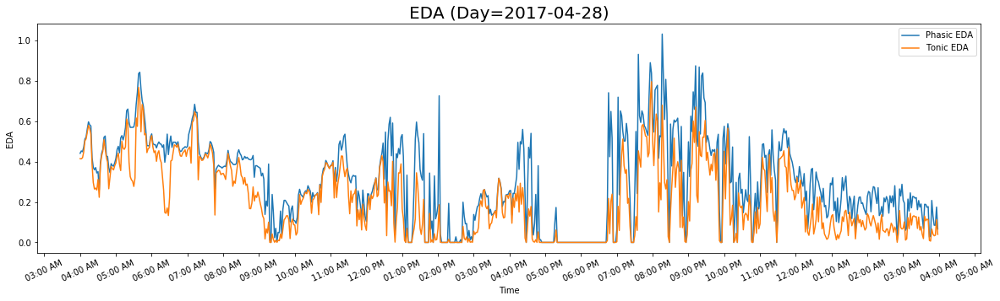

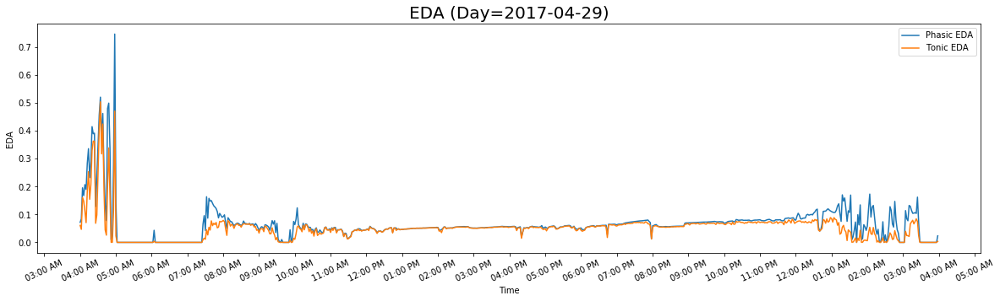

...

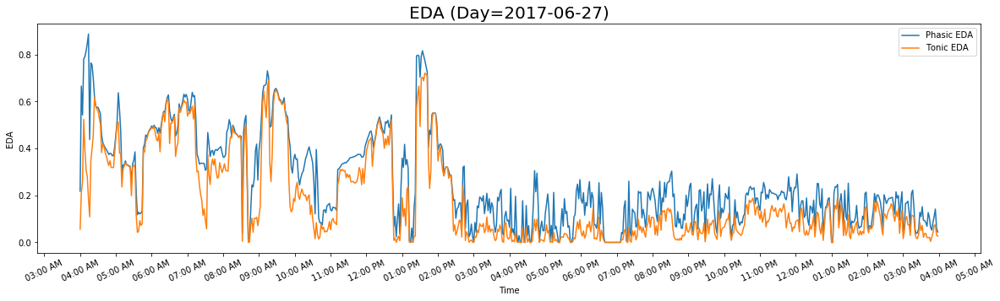

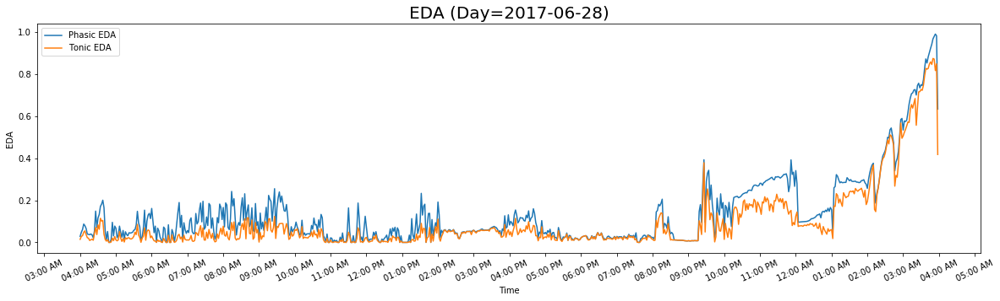

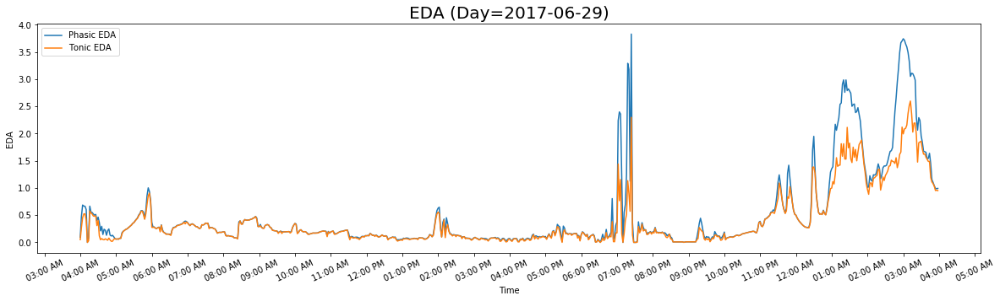

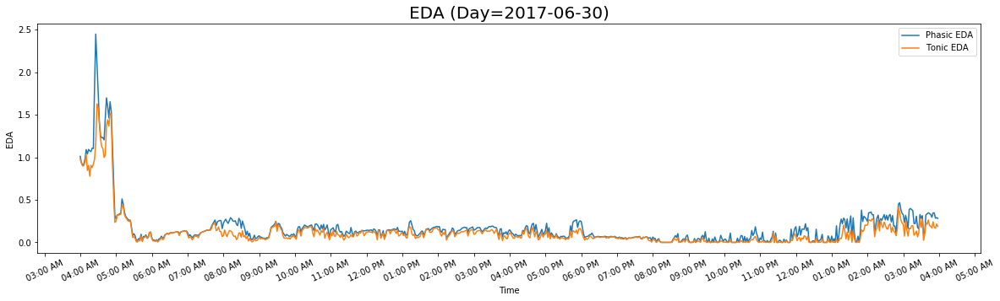

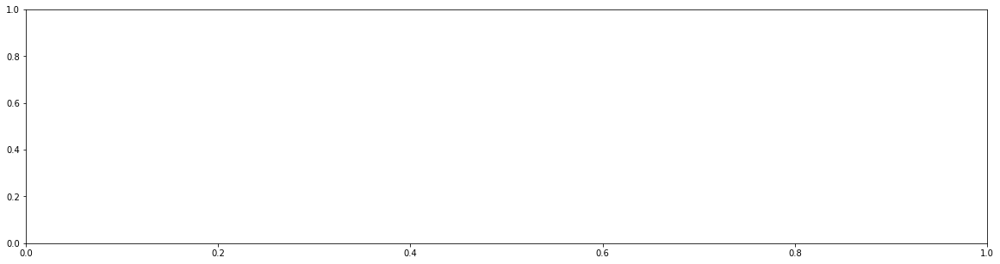

In [77]:
#eda daily with phasic and tonic component
import matplotlib.pyplot as plt
from datetime import time
import seaborn as sns
import matplotlib.dates as mdates
import seaborn as sns
# plt.figure(1,figsize=(20, 5))
Fs = 8.
count=0


for date in strdate:
    count=count+1
    if count>15:
        fig, ax = plt.subplots(figsize=(20,5))#figsize=(15,15)
        count=count+1
        df=df_eda.loc[date]
        y=df['filtered_eda'].values
        [df['phasic'], p, df['tonic'], l, d, e, obj] = cvxEDA.cvxEDA(y, 1./Fs)
        #     df_final = df[df['tonic'] > 0]
        df[df['tonic'] < 0] = 0
#         df = df[df['tonic'] < 0==0]
        df_final = df.resample('2T').mean()
        #     print(df_final)
        #     print(df_final)
        x=df_final.index
        plt.plot(x,df_final['filtered_eda'],label='Phasic EDA')
        plt.plot(x,df_final['tonic'],label='Tonic EDA')

        #     ax=df_final['filtered_eda'].plot()
        #     ax=df_final['tonic'].plot()
        #     ax.set_xlim([date+" 00:00:00", date+" 23:59:59"])
        #     ax.set_xlim(["00:00:00", "23:59:59"])
        hours = mdates.HourLocator(interval = 1)
        h_fmt = mdates.DateFormatter('%I:%M %p')
        ax.xaxis.set_major_locator(hours)
        ax.xaxis.set_major_formatter(h_fmt)
        ax=plt.gca()
        #     ax.set_xticklabels(tickstime)
        plt.title("EDA (Day="+str(date)+")",fontsize=20)
        plt.legend()
        plt.xticks( rotation=25 )
        ax.set_ylabel('EDA')
        ax.set_xlabel('Time')
        plt.savefig("Migraine_Plots/EDA/daily_eda/Date="+str(date)+""+".png",bbox_inches="tight")
#     plt.figure(1,figsize=(20, 5))
#     if(count==10):
#         break

In [45]:
#eda daily
import matplotlib.pyplot as plt
from datetime import time
import seaborn as sns
import matplotlib.dates as mdates
import seaborn as sns
for date in strdate:
    ax=df_sub1.loc[date]['filtered_eda'].plot()
    ax.set_xlim([date+" 00:00:00", date+" 23:59:59"])
    hours = mdates.HourLocator(interval = 1)
    h_fmt = mdates.DateFormatter('%I:%M %p')
    ax.xaxis.set_major_locator(hours)
    ax.xaxis.set_major_formatter(h_fmt)
    ax=plt.gca()
#     ax.set_xticklabels(tickstime)
    plt.title("EDA (Day="+str(date)+")",fontsize=20)
    ax.set_ylabel('EDA')
    ax.set_xlabel('Time')
    plt.savefig("Migraine_Plots/EDA/daily_eda/Date="+str(date)+""+".png",bbox_inches="tight")


In [ ]:
df_sub1.loc['2017-05-31 08']

In [16]:
# #Weekly with matplotlib sorting dates in correct order
# import matplotlib.pyplot as plt
# from datetime import time
# import matplotlib.dates as mdates
# import seaborn as sns
# import numpy as np
# sns.set(style="darkgrid")


# # df_sub.sort_values(by='datess')
# # df_sub.head()
# # all_dates = set(df_sub['datess'])#Getting all dates
# # all_detes=sorted(all_dates)
# # all_date_list = list(sorted(all_dates))

# pd.plotting.register_matplotlib_converters()
# # df_temp.plot(x = "DatenTime", y = "TEMP",ax = ax, use_index =True, label = date,marker = 'o', rot=90)
# i = 0
# fig, ax = plt.subplots(figsize=(25,15))#figsize=(15,15)
# markers=['o', '.', ',', 'x', '+', 'v', '^', '<', '>', 's', 'd']
# i=0
# for date in strdate:
#     df = df_sub1.loc[date]
# #     plt.plot(df['NewTime'],df['TEMP'],markers[i],label=date+"='{0}'".format(markers[i]))
#     plt.plot(df['NewTime'],df['Mean'],markers[i],label=date)
#     i=i+1   
#     if i % 7==0:
#         i = 0
#         print(date)
# #         plt.plot(df['NewTime'],df['Mean'], label='Mean', linestyle='--',c='darkgrey')
# #         datenums=md.date2num(date)
#         plt.xticks( rotation=25 )
# #         ax=plt.gca()
# #         xfmt = md.DateFormatter('%Y-%m-%d %H:%M:%S')
# #         ax.xaxis.set_major_formatter(xfmt)
#         ax.set_xlim([date+" 00:00:00", date+" 23:59:59"])

# #         ax.set_xlim(["00:00:00", "23:59:59"])
#         plt.title("EDA (week="+str(date)+")",fontsize=20)
# #         plt.title("Skin Temperature (Month="+str(date.strftime("%B"))+")",fontsize=20)
        
#         hours = mdates.HourLocator(interval = 1)
#         h_fmt = mdates.DateFormatter('%H:%M:%S')
#         ax.xaxis.set_major_locator(hours)
#         ax.xaxis.set_major_formatter(h_fmt)
#         ax.set_ylabel('EDA')
#         ax.set_xlabel('Time')
#         fig.autofmt_xdate()
#         plt.legend(bbox_to_anchor=(1.05, 1), loc=2, borderaxespad=0.)
# #         plt.grid(linestyle='--', alpha=0.5)
       
# #         plt.legend(bbox_to_anchor=(0, 1), loc='upper left', ncol=1)
# #         plt.legend()
# #         fig.tight_layout()
# #         fig.savefig('test.pdf')
# #         plt.savefig("Migraine_Plots/EDA/weekly_eda/week="+str(date)+""+".png",bbox_inches="tight")
#         plt.show()  
        


In [ ]:
#monthly with matplotlib sorting dates in correct order
import matplotlib.pyplot as plt
from datetime import time
import matplotlib.dates as mdates
import seaborn as sns
import numpy as np
sns.set(style="darkgrid")


# df_sub.sort_values(by='datess')
# df_sub.head()
# all_dates = set(df_sub['datess'])#Getting all dates
# all_detes=sorted(all_dates)
# all_date_list = list(sorted(all_dates))

pd.plotting.register_matplotlib_converters()
# df_temp.plot(x = "DatenTime", y = "TEMP",ax = ax, use_index =True, label = date,marker = 'o', rot=90)
i = 0
fig, ax = plt.subplots()#figsize=(15,15)
markers=['o', '.', ',', 'x', '+', 'v', '^', '<', '>', 's', 'd']
i=0
for date in strdate:
    df = df_sub1.loc[date]
#     plt.plot(df['NewTime'],df['TEMP'],markers[i],label=date+"='{0}'".format(markers[i]))
    plt.plot(df['NewTime'],df['EDA'],'o')
    i=i+1   
    if i % 90==0:
        i = 0
        print(date)
#         plt.plot(df['NewTime'],df['Mean'], label='Mean', linestyle='--',c='darkgrey')
#         datenums=md.date2num(date)
        plt.xticks( rotation=25 )
        ax=plt.gca()
#         xfmt = md.DateFormatter('%Y-%m-%d %H:%M:%S')
#         ax.xaxis.set_major_formatter(xfmt)
        ax.set_xlim(["00:00:00", "23:59:59"])
        plt.title("EDA",fontsize=20)
#         plt.title("EDA (week="+str(date)+")",fontsize=20)
#         plt.title("Skin Temperature (Month="+str(date.strftime("%B"))+")",fontsize=20)
        
#         hours = mdates.HourLocator(interval = 1)
#         h_fmt = mdates.DateFormatter('%H:%M:%S')
#         ax.xaxis.set_major_locator(hours)
#         ax.xaxis.set_major_formatter(h_fmt)
        ax.set_ylabel('EDA')
        ax.set_xlabel('Time')
#         fig.autofmt_xdate()
        plt.legend(bbox_to_anchor=(1.05, 1), loc=2, borderaxespad=0.)
#         plt.grid(linestyle='--', alpha=0.5)
       
#         plt.legend(bbox_to_anchor=(0, 1), loc='upper left', ncol=1)
#         plt.legend()
#         fig.tight_layout()
#         fig.savefig('test.pdf')
        plt.savefig("Migraine_Plots/EDA/monthly_eda/3months="+str(date)+""+".png",bbox_inches="tight")
        plt.show()  
        


In [117]:
df_eda.head(100)

,EDA,filtered_eda,date,NewTime
2017-04-05 10:51:39-04:00,0.000000,0.000000,2017-04-05,10:51:39
2017-04-05 10:51:39.040000-04:00,0.843838,0.000887,2017-04-05,10:51:39.040000
2017-04-05 10:51:39.080000-04:00,1.191116,0.009220,2017-04-05,10:51:39.080000
2017-04-05 10:51:39.120000-04:00,1.629110,0.046333,2017-04-05,10:51:39.120000
2017-04-05 10:51:39.160000-04:00,2.106829,0.151794,2017-04-05,10:51:39.160000
2017-04-05 10:51:39.200000-04:00,2.594893,0.369281,2017-04-05,10:51:39.200000
2017-04-05 10:51:39.240000-04:00,3.117440,0.720739,2017-04-05,10:51:39.240000
2017-04-05 10:51:39.280000-04:00,3.613620,1.190268,2017-04-05,10:51:39.280000
2017-04-05 10:51:39.320000-04:00,4.109793,1.731034,2017-04-05,10:51:39.320000
2017-04-05 10:51:39.360000-04:00,4.207560,2.288261,2017-04-05,10:51:39.360000


,EDA,date,NewTime,filtered_eda
2017-05-19 00:00:00-04:00,3.128693,2017-05-19,00:00:00,3.034662
2017-05-19 00:00:00.250000-04:00,3.160709,2017-05-19,00:00:00.250000,3.036155
2017-05-19 00:00:00.500000-04:00,3.169673,2017-05-19,00:00:00.500000,3.043432
2017-05-19 00:00:00.750000-04:00,3.167112,2017-05-19,00:00:00.750000,3.059385
2017-05-19 00:00:01-04:00,3.153025,2017-05-19,00:00:01,3.084833


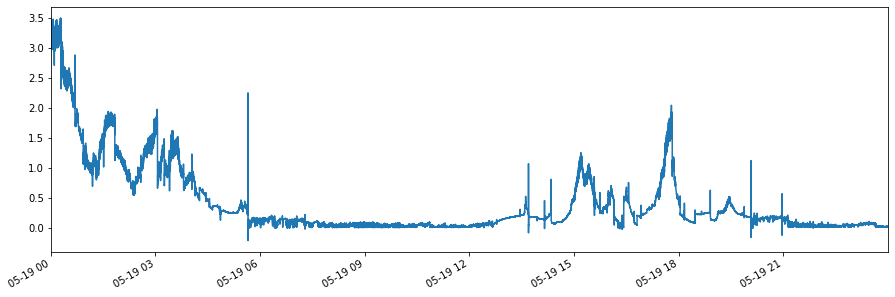

In [18]:
import numpy
import cvxEDA
# import matplotlib as plt
import matplotlib.pyplot as plt
#  r: phasic component
#        p: sparse SMNA driver of phasic component
#        t: tonic component
#        l: coefficients of tonic spline
#        d: offset and slope of the linear drift term
#        e: model residuals
#        obj: value of objective function being minimized (eq 15 of paper)
#     """
# 2017-6-18
# df_eda.drop('time_stamp', axis=1, inplace=True)

df_eda.head()
y1=df_eda.loc['2017-05-19']
y1['filtered_eda'].plot()
y1.head()

[[3.128693 datetime.date(2017, 5, 19) datetime.time(0, 0)
  3.0346615447075957]
 [3.160709 datetime.date(2017, 5, 19) datetime.time(0, 0, 0, 250000)
  3.0361552923185084]
 [3.169673 datetime.date(2017, 5, 19) datetime.time(0, 0, 0, 500000)
  3.0434319508725083]
 ...
 [0.010244 datetime.date(2017, 5, 19) datetime.time(23, 59, 59, 250000)
  0.010450633770729448]
 [0.008962999999999999 datetime.date(2017, 5, 19)
  datetime.time(23, 59, 59, 500000) 0.010603345967378835]
 [0.008962999999999999 datetime.date(2017, 5, 19)
  datetime.time(23, 59, 59, 750000) 0.010467745588837405]]


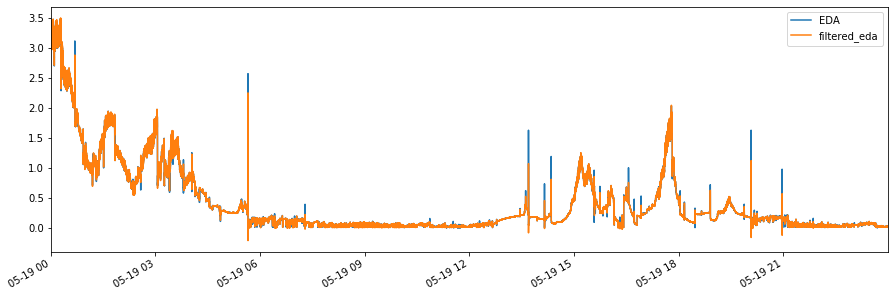

In [21]:
x=y1
x.plot()
print(x.values)
y=x['filtered_eda'].values

In [22]:
print(y)

[3.03466154 3.03615529 3.04343195 ... 0.01045063 0.01060335 0.01046775]


In [51]:
import neurokit as nk

processed_eda = nk.eda_process(y)


In [52]:
processed_eda

{'df':          EDA_Raw  EDA_Filtered  EDA_Phasic  EDA_Tonic  SCR_Onsets  \
 0       3.128693      3.135614    0.000000   4.661050         NaN   
 1       3.160709      3.135561    0.000000   4.660956         1.0   
 2       3.169673      3.135508    0.000057   4.660862         NaN   
 3       3.167112      3.135454    0.000208   4.660768         NaN   
 4       3.153025      3.135399    0.000360   4.660674         NaN   
 5       3.135096      3.135344    0.000511   4.660579         NaN   
 6       3.113326      3.135289    0.000662   4.660485         NaN   
 7       3.092835      3.135234    0.000812   4.660390         NaN   
 8       3.077468      3.135178    0.000962   4.660295         NaN   
 9       3.065942      3.135122    0.001112   4.660200         NaN   
 10      3.056978      3.135065    0.001262   4.660105         NaN   
 11      3.048013      3.135009    0.001411   4.660009         NaN   
 12      3.041610      3.134951    0.001560   4.659913         NaN   
 13      3.039

     pcost       dcost       gap    pres   dres
 0: -8.5809e+04 -8.5429e+04  5e+05  7e+02  2e-02
 1: -8.5541e+04 -1.5467e+05  8e+04  1e+02  3e-03
 2: -8.5445e+04 -1.0838e+05  2e+04  2e+01  6e-04
 3: -8.5412e+04 -9.4230e+04  9e+03  8e+00  2e-04
 4: -8.5302e+04 -8.9284e+04  4e+03  3e+00  6e-05
 5: -8.5205e+04 -8.7376e+04  2e+03  1e+00  2e-05
 6: -8.5419e+04 -8.6112e+04  7e+02  2e-01  5e-06
 7: -8.5606e+04 -8.5877e+04  3e+02  6e-03  2e-07
 8: -8.5731e+04 -8.5872e+04  1e+02  3e-03  7e-08
 9: -8.5802e+04 -8.5868e+04  7e+01  9e-04  2e-08
10: -8.5823e+04 -8.5867e+04  4e+01  4e-04  9e-09
11: -8.5847e+04 -8.5865e+04  2e+01  1e-04  3e-09
12: -8.5856e+04 -8.5864e+04  8e+00  3e-05  8e-10
13: -8.5860e+04 -8.5864e+04  4e+00  1e-05  3e-10
14: -8.5862e+04 -8.5863e+04  2e+00  3e-06  8e-11
15: -8.5863e+04 -8.5863e+04  7e-01  1e-06  2e-11
16: -8.5863e+04 -8.5863e+04  3e-01  2e-07  5e-12
17: -8.5863e+04 -8.5863e+04  9e-02  4e-08  9e-13
18: -8.5863e+04 -8.5863e+04  3e-02  5e-09  1e-13
19: -8.5863e+04 -8.58

C:\Users\Chisel-Lab\Anaconda3\lib\site-packages\ipykernel_launcher.py:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  """


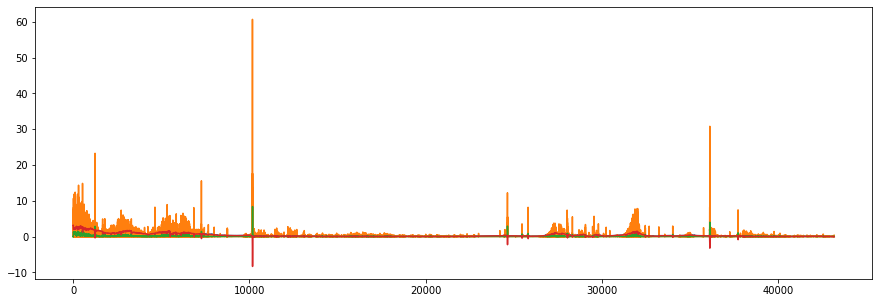

In [39]:
import cvxEDA
y=x['EDA'].values
# yn = (y - y.mean()) / y.std()
Fs = 8.
[x['phasic'], p, x['tonic'], l, d, e, obj] = cvxEDA.cvxEDA(y, 1./Fs)
import pylab as pl
tm = pl.arange(1., len(y)+1.) / Fs
# pl.hold(True)
pl.plot(tm, y)
pl.plot(tm, p)
pl.plot(tm, r)

pl.plot(tm, t)
pl.show()

In [49]:
xone['tonic']=x['tonic'].resample('1T').mean()
xone.head()

,EDA,filtered_eda,phasic,tonic
2017-05-19 00:00:00-04:00,3.109497,3.109499,0.762573,2.346792
2017-05-19 00:01:00-04:00,3.105745,3.101504,0.941857,2.163642
2017-05-19 00:02:00-04:00,3.097869,3.102224,0.834499,2.263489
2017-05-19 00:03:00-04:00,3.107624,3.106452,0.972881,2.134723
2017-05-19 00:04:00-04:00,3.120446,3.120422,0.801821,2.318523


(0, 3)

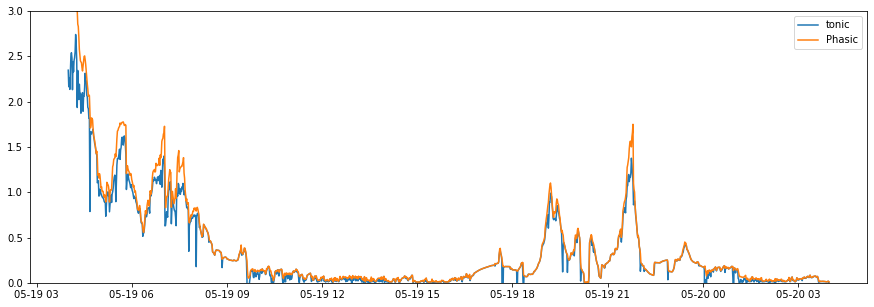

In [50]:

# # # print(y.loc['2017-06-18 00:00'])
# yn = (y - y.mean()) / y.std()
# Fs = 25.
# [r, p, t, l, d, e, obj] = cvxEDA.cvxEDA(yn, 1./Fs)
# import pylab as pl
# tm = pl.arange(1., len(y)+1.) / Fs
# print(tm)
# plt.plot(tm,p,label="sparse SMNAphasic")


# plt.plot(tm,r,label="phasic component")
plt.plot(xone['tonic'],label="tonic")
plt.plot(xone['filtered_eda'],label="Phasic")
# plt.plot(tm,t,label="offset of slope")
# # plt.plot(tm,e,label="model residual")
plt.legend()
plt.ylim([0,3])
# plt.xlim([0,1000])
# plt.show()
# pl.hold(True
# plt.savefig("phasic+tonic"+".png",bbox_inches="tight")
# plt.plot(tm, yn)
# plt.plot(tm, r)
# plt.plot(tm, p)
# plt.plot(tm, t)
# plt.show()

(0, 5)

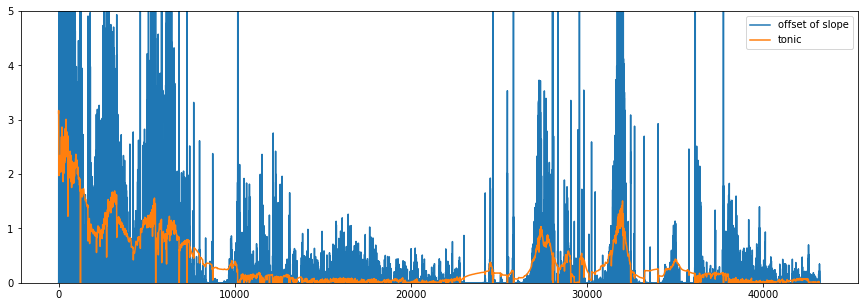

In [38]:

# # # print(y.loc['2017-06-18 00:00'])
# yn = (y - y.mean()) / y.std()
# Fs = 25.
# [r, p, t, l, d, e, obj] = cvxEDA.cvxEDA(yn, 1./Fs)
# import pylab as pl
# tm = pl.arange(1., len(y)+1.) / Fs
# print(tm)
# plt.plot(tm,p,label="sparse SMNAphasic")


# plt.plot(tm,r,label="phasic component")

# plt.plot(tm,y,label="Phasic")
plt.plot(tm,p,label="offset of slope")
plt.plot(tm,t,label="tonic")
# # plt.plot(tm,e,label="model residual")
plt.legend()
plt.ylim([0,5])
# plt.xlim([0,1000])
# plt.show()
# pl.hold(True
# plt.savefig("phasic+tonic"+".png",bbox_inches="tight")
# plt.plot(tm, yn)
# plt.plot(tm, r)
# plt.plot(tm, p)
# plt.plot(tm, t)
# plt.show()

     pcost       dcost       gap    pres   dres
 0: -1.6314e+03 -1.5503e+03  1e+05  3e+02  4e-01
 1: -1.5606e+03 -6.0535e+03  5e+03  1e+01  2e-02
 2: -1.5591e+03 -2.3754e+03  8e+02  2e+00  3e-03
 3: -1.5515e+03 -1.9147e+03  4e+02  7e-01  1e-03
 4: -1.5521e+03 -1.7364e+03  2e+02  3e-01  3e-04
 5: -1.5620e+03 -1.6845e+03  1e+02  1e-01  2e-04
 6: -1.6122e+03 -1.6438e+03  3e+01  2e-02  3e-05
 7: -1.6266e+03 -1.6410e+03  1e+01  7e-03  9e-06
 8: -1.6336e+03 -1.6404e+03  7e+00  3e-03  4e-06
 9: -1.6375e+03 -1.6402e+03  3e+00  1e-03  1e-06
10: -1.6389e+03 -1.6401e+03  1e+00  3e-04  4e-07
11: -1.6394e+03 -1.6401e+03  6e-01  1e-04  2e-07
12: -1.6398e+03 -1.6401e+03  3e-01  5e-05  6e-08
13: -1.6399e+03 -1.6400e+03  1e-01  1e-05  1e-08
14: -1.6400e+03 -1.6400e+03  8e-02  6e-06  8e-09
15: -1.6400e+03 -1.6400e+03  3e-02  2e-06  2e-09
16: -1.6400e+03 -1.6400e+03  2e-02  1e-06  1e-09
17: -1.6400e+03 -1.6400e+03  8e-03  3e-07  4e-10
18: -1.6400e+03 -1.6400e+03  5e-03  1e-07  2e-10
19: -1.6400e+03 -1.64

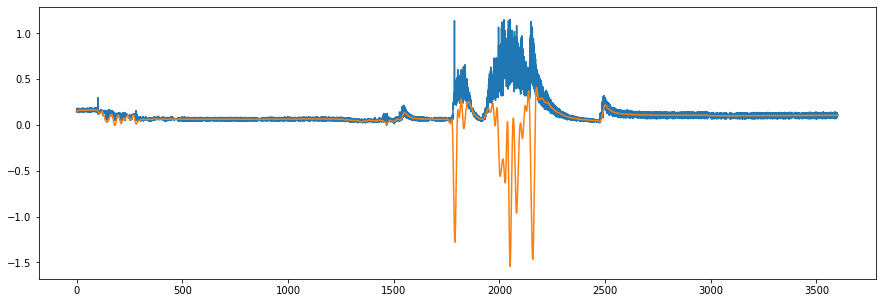

In [114]:
import cvxEDA
# yn = (y - y.mean()) / y.std()
Fs = 25.
[r, p, t, l, d, e, obj] = cvxEDA.cvxEDA(y, 1./Fs)
import pylab as pl
tm = pl.arange(1., len(y)+1.) / Fs
# pl.hold(True)
# pl.plot(tm, yn)
pl.plot(tm, y)
# pl.plot(tm, p)
pl.plot(tm, t)
pl.show()

(0, 5000)

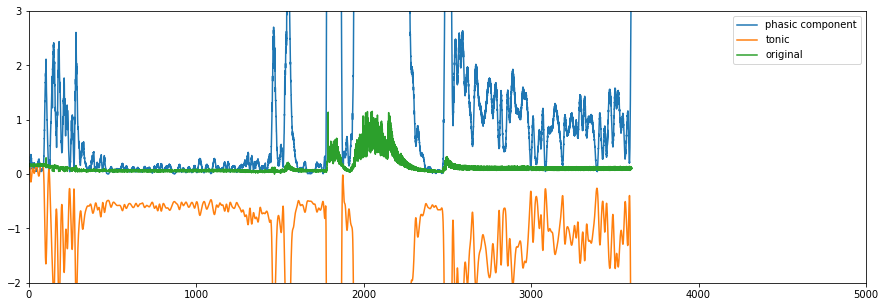

In [111]:

plt.plot(tm,r,label="phasic component")
plt.plot(tm,t,label="tonic")
plt.plot(tm,y,label="original")
# plt.plot(tm,t,label="offset of slope")
# # plt.plot(tm,e,label="model residual")
plt.legend()
plt.ylim([-2,3])
plt.xlim([0,5000])

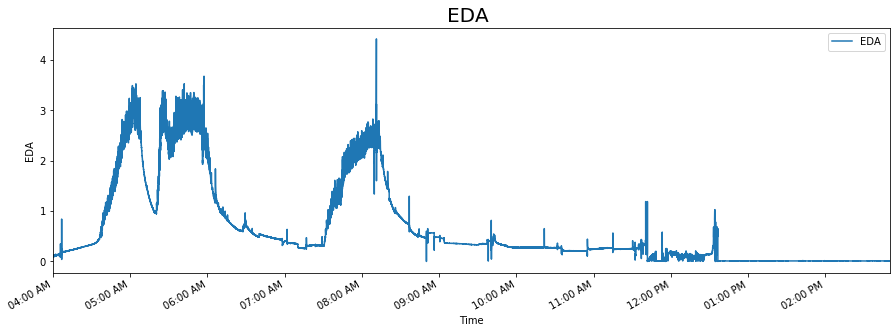

In [30]:
import matplotlib.dates as mdates
# fig, ax = plt.subplots()#figsize=(15,15)
ax=x.plot()
# hours = mdates.HourLocator(interval = 1)
h_fmt = mdates.DateFormatter('%I:%M %p')
# ax.xaxis.set_major_locator(hours)
ax.xaxis.set_major_formatter(h_fmt)
ax=plt.gca()
#     ax.set_xticklabels(tickstime)
plt.title("EDA ",fontsize=20)
ax.set_ylabel('EDA')
ax.set_xlabel('Time')
plt.savefig("original"+".png",bbox_inches="tight")

In [ ]:


#monthly with matplotlib sorting dates in correct order
import matplotlib.pyplot as plt
from datetime import time
import matplotlib.dates as mdates
import seaborn as sns
import numpy as np
# sns.set(style="darkgrid")
df_sub = df_eda[['datess','NewTime','EDA','mean_total']]

df_sub.sort_values(by='datess')
df_sub.head()
all_dates = set(df_sub['datess'])#Getting all dates
all_detes=sorted(all_dates)
all_date_list = list(sorted(all_dates))

pd.plotting.register_matplotlib_converters()
# df_temp.plot(x = "DatenTime", y = "TEMP",ax = ax, use_index =True, label = date,marker = 'o', rot=90)
i = 0
# fig, ax = plt.subplots(figsize=(25,15))#figsize=(15,15)
markers=['o', '.', ',', 'x', '+', 'v', '^', '<', '>', 's', 'd']
i=0
df_temp.head(5)
for date in all_date_list:
    df = df_sub[df_sub.datess == date]
#     plt.plot(df['NewTime'],df['TEMP'],markers[i],label=date+"='{0}'".format(markers[i]))
    plt.plot(df['NewTime'],df['EDA'],'o')
    i=i+1   
    if i % 30==0:
        i = 0
        print(date)
        plt.plot(df['NewTime'],df['mean_total'], label='Mean', linestyle='--',c='darkgrey')
#         datenums=md.date2num(date)
        plt.xticks( rotation=25 )
        ax=plt.gca()
#         xfmt = md.DateFormatter('%Y-%m-%d %H:%M:%S')
#         ax.xaxis.set_major_formatter(xfmt)
        ax.set_xlim(["00:00:00", "23:59:59"])
        plt.title("EDA (month="+str(date.strftime("%B"))+")",fontsize=20)
#         plt.title("Skin Temperature (Month="+str(date.strftime("%B"))+")",fontsize=20)
        
#         hours = mdates.HourLocator(interval = 1)
#         h_fmt = mdates.DateFormatter('%H:%M:%S')
#         ax.xaxis.set_major_locator(hours)
#         ax.xaxis.set_major_formatter(h_fmt)
        ax.set_ylabel('EDA')
        ax.set_xlabel('Time')
        fig.autofmt_xdate()
        plt.legend(bbox_to_anchor=(1.05, 1), loc=2, borderaxespad=0.)
#         plt.grid(linestyle='--', alpha=0.5)
       
#         plt.legend(bbox_to_anchor=(0, 1), loc='upper left', ncol=1)
#         plt.legend()
#         fig.tight_layout()
#         fig.savefig('test.pdf')
        plt.savefig("monthly_eda/="+str(date)+""+".png",bbox_inches="tight")
        plt.show()  
        


###### Daily EDA Plots

In [ ]:
# #daily with matplotlib sorting dates in correct order
import matplotlib.pyplot as plt
from datetime import time
import matplotlib.dates as mdates
import seaborn as sns
import numpy as np
# sns.set(style="darkgrid")
df_sub = df_eda[['datess','NewTime','EDA','mean_total']]

df_sub.sort_values(by='datess')
df_sub.head()
all_dates = set(df_sub['datess'])#Getting all dates
all_detes=sorted(all_dates)
all_date_list = list(sorted(all_dates))

pd.plotting.register_matplotlib_converters()
# df_temp.plot(x = "DatenTime", y = "TEMP",ax = ax, use_index =True, label = date,marker = 'o', rot=90)
i = 0
# fig, ax = plt.subplots(figsize=(25,15))#figsize=(15,15)
markers=['o', '.', ',', 'x', '+', 'v', '^', '<', '>', 's', 'd']
i=0
df_temp.head(5)
for date in all_date_list:
    df = df_sub[df_sub.datess == date]
#     plt.plot(df['NewTime'],df['TEMP'],markers[i],label=date+"='{0}'".format(markers[i]))
    plt.plot(df['NewTime'],df['EDA'],'o',c='red',label=str(date))
    i=i+1   
    if i % 1==0:
        i = 0
        print(date)
        plt.plot(df['NewTime'],df['mean_total'], label='Mean', linestyle='--',c='darkgrey')
#         datenums=md.date2num(date)
        plt.xticks( rotation=25 )
        ax=plt.gca()
#         xfmt = md.DateFormatter('%Y-%m-%d %H:%M:%S')
#         ax.xaxis.set_major_formatter(xfmt)
        ax.set_xlim(["00:00:00", "23:59:59"])
        plt.title("EDA (Day="+str(date.strftime("%A"))+")",fontsize=20)
#         plt.title("Skin Temperature (Month="+str(date.strftime("%B"))+")",fontsize=20)
        
#         hours = mdates.HourLocator(interval = 1)
#         h_fmt = mdates.DateFormatter('%H:%M:%S')
#         ax.xaxis.set_major_locator(hours)
#         ax.xaxis.set_major_formatter(h_fmt)
        ax.set_ylabel('EDA')
        ax.set_xlabel('Time')
        fig.autofmt_xdate()
        plt.legend(bbox_to_anchor=(1.05, 1), loc=2, borderaxespad=0.)
#         plt.grid(linestyle='--', alpha=0.5)
       
#         plt.legend(bbox_to_anchor=(0, 1), loc='upper left', ncol=1)
#         plt.legend()
#         fig.tight_layout()
#         fig.savefig('test.pdf')
        plt.savefig("daily_eda/Date="+str(date)+""+".png",bbox_inches="tight")
        plt.show()  
        


# Heart Rate

In [ ]:
# #Reading HR Data
# df_hr = get_all_data(dict_vars['HR'])
# df_hr.reset_index(inplace=True,drop=True)

In [ ]:
# #Decribing Content of HR
# print("\nInitially Data Size: " , df_hr.shape,"\n")
# print("Diplaying top 10 values: ")
# print(df_hr.head(10 
# df_hr.describe()

In [ ]:
# #Displaying Bar Graph of Count
# display_frequency_bar_chart(df_hr['HR'],"Heart Rate (Hz)","Count")
# print("Data Size" + str(df_hr.shape))
# df_hr.describe()

# BVP

In [ ]:
# #Reading BVP Data
# df_bvp = get_all_data(dict_vars['BVP'])
# df_bvp.reset_index(inplace=True,drop=True)

In [ ]:
# #Decribing Content of BVP
# print("\nInitially Data Size: " , df_bvp.shape,"\n")
# print("Diplaying top 10 values: ")
# print(df_bvp.head(10))
# df_bvp.describe()

In [ ]:
# #Displaying Bar Graph of Count
# display_frequency_bar_chart(df_hr['HR'],"Heart Rate (Hz)","Count")
# print("Data Size" + str(df_hr.shape))
# df_bvp.describe()

# Accelerometer

In [ ]:
# #Reading Accelerometer Data
# df_bvp = get_all_data(dict_vars['BVP'])
# df_bvp.reset_index(inplace=True,drop=True)